In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate
from matplotlib.collections import LineCollection
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
plt.style.use("dstyle")
_ = plt.figure()
plt.style.use("dstyle")

<Figure size 3000x2400 with 0 Axes>

In [3]:
MPC_CGS     = 3.0857e24
KM_CGS      = 1.e5
GYRS_CGS    = 3.1536e16


H0 = 67.66

H0_cgs = H0 * (KM_CGS / MPC_CGS)


z_infty = 1e12

In [4]:
table_fname_Planck = "expansion/PlanckFine.txt"
table_fname_Radiation = "expansion/RadiationFine.txt"
table_fname_Lambda = "expansion/LambdaFine.txt"
table_fname_Matter = "expansion/MatterFine.txt"

table_Planck = np.loadtxt(table_fname_Planck, skiprows=10, delimiter =',')
table_Radiation = np.loadtxt(table_fname_Radiation, skiprows=10, delimiter =',')
table_Lambda = np.loadtxt(table_fname_Lambda, skiprows=10, delimiter =',')
table_Matter = np.loadtxt(table_fname_Matter, skiprows=10, delimiter =',')

In [5]:
z_Planck = table_Planck[:,0]
l_z_Planck = table_Planck[:,1]
a_Planck = table_Planck[:,2]
time_look_Planck = table_Planck[:,3]
time_age_Planck = table_Planck[:,4]

z_Radiation = table_Radiation[:,0]
l_z_Radiation = table_Radiation[:,1]
a_Radiation = table_Radiation[:,2]
time_look_Radiation = table_Radiation[:,3]
time_age_Radiation = table_Radiation[:,4]


z_Matter = table_Matter[:,0]
l_z_Matter = table_Matter[:,1]
a_Matter = table_Matter[:,2]
time_look_Matter = table_Matter[:,3]
time_age_Matter = table_Matter[:,4]


z_Lambda = table_Lambda[:,0]
l_z_Lambda = table_Lambda[:,1]
a_Lambda = table_Lambda[:,2]
time_look_Lambda = table_Lambda[:,3]
time_age_Lambda = table_Lambda[:,4]

In [6]:
z_radmateq = 3400
a_radmateq = (1./(z_radmateq+1))

z_matDEeq = 0.3
a_matDEeq = (1./(z_matDEeq+1))

print(z_radmateq, a_radmateq)
print(z_matDEeq, a_matDEeq)

3400 0.00029403116730373417
0.3 0.7692307692307692


In [7]:
redshifts_lookref = np.array([0.5, 1.0, 2.0])
a_lookref = 1. / (1. + redshifts_lookref)
a_lookref_0, a_lookref_1, a_lookref_2 = a_lookref
strlabel_lookref_0 = rf"$z = {redshifts_lookref[0]:.2f}$"
strlabel_lookref_1 = rf"$z = {redshifts_lookref[1]:.2f}$"
strlabel_lookref_2 = rf"$z = {redshifts_lookref[2]:.2f}$"

### Radiation Domination

$$
t_{\textrm{look}}(z) H_0 = \int_{0}^{z} \frac{1}{(1+z')\xi(z')} \textrm{d}z' = \int_{0}^{z} \frac{1}{(1+z') \sqrt{\Omega_{\textrm{R}}} (1 + z')^{2}} \textrm{d}z' = \frac{1}{\sqrt{\Omega_{\textrm{R}}}} \int_{0}^{z} (1 + z')^{-3} \textrm{d}z'
$$

$$
t_{\textrm{look}}(z) H_0 = \frac{1}{\sqrt{\Omega_{\textrm{R}}}} \frac{-1}{2} (1+z')^{-2} \Bigr|_{0}^{z} = \frac{1}{2\sqrt{\Omega_{\textrm{R}}}} (1+z')^{-2} \Bigr|_{z}^{0} = \frac{1}{2\sqrt{\Omega_{\textrm{R}}}}  \left( \left(\frac{1}{1 + 0} \right)^{2} - \left(\frac{1}{1 + z} \right)^{2} \right)
$$

$$
t_{\textrm{look}}(z) H_0 = \frac{1}{2 \sqrt{\Omega_{\textrm{R}}}}  \left( 1 - (1 + z)^{-2} \right) 
$$

$$
1 - (1 + z)^{-2} = 2 \sqrt{\Omega_{\textrm{R}}} t_{\textrm{look}}(z) H_0 
$$

$$
(1 + z)^{-1} = a(t) = \left(1 - 2 \sqrt{\Omega_{\textrm{R}}} t_{\textrm{look}}(z) H_0  \right)^{1/2}
$$

### Dark Energy Domination

$$
t_{\textrm{look}}(z) H_0 = \int_{0}^{z} \frac{1}{(1+z')\xi(z')} \textrm{d}z' = \int_{0}^{z} \frac{1}{(1+z') \sqrt{\Omega_{\Lambda}} } \textrm{d}z' = \frac{1}{\sqrt{\Omega_{\Lambda}}} \int_{0}^{z} (1 + z')^{-1} \textrm{d}z'
$$

$$
t_{\textrm{look}}(z) H_0 = \frac{1}{\sqrt{\Omega_{\Lambda}}} \ln(1+z') \Bigr|_{0}^{z}
$$

$$
t_{\textrm{look}}(z) H_0 = \frac{1}{\sqrt{\Omega_{\Lambda}}}  \ln (1 + z)
$$

$$
(1 + z)^{-1} = a(t) = \exp\left[ - \sqrt{\Omega_{\Lambda}} t_{\textrm{look}}(z) H_0 \right]
$$

### Matter Domination

$$
t_{\textrm{look}}(z) H_0 = \int_{0}^{z} \frac{1}{(1+z')\xi(z')} \textrm{d}z' = \int_{0}^{z} \frac{1}{(1+z') \sqrt{\Omega_{\textrm{m}}} (1 + z')^{3/2}} \textrm{d}z' = \frac{1}{\sqrt{\Omega_{\textrm{m}}}} \int_{0}^{z} (1 + z')^{-5/2} \textrm{d}z'
$$

$$
t_{\textrm{look}}(z) H_0 = \frac{1}{\sqrt{\Omega_{\textrm{m}}}} \frac{-2}{3} (1+z')^{-3/2} \Bigr|_{0}^{z} = \frac{2}{3\sqrt{\Omega_{\textrm{m}}}} (1+z')^{-3/2} \Bigr|_{z}^{0} = \frac{2}{3\sqrt{\Omega_{\textrm{m}}}}  \left( \left(\frac{1}{1 + 0} \right)^{3/2} - \left(\frac{1}{1 + z} \right)^{3/2} \right)
$$

$$
t_{\textrm{look}}(z) H_0 = \frac{2}{3 \sqrt{\Omega_{\textrm{m}}}}  \left( 1 - (1 + z)^{-3/2} \right) 
$$

$$
1 - (1 + z)^{-3/2} = \frac{3 \sqrt{\Omega_{\textrm{m}}}}{2}  t_{\textrm{look}}(z) H_0
$$

$$
(1 + z)^{-1} = \left(1 -  \frac{3 \sqrt{\Omega_{\textrm{m}}}}{2}  t_{\textrm{look}}(z) H_0 \right)^{2/3}
$$

In [8]:
def a2z(a):
    return (1. / a) - 1.

def z2a(z):
    return 1. / (1. + z)


In [9]:
Planck_label = r'$\it{Planck}\ \rm{2018}$'
Lambda_label = r'$\Omega_{\Lambda}, a(t) \propto \exp(t)$'
Radiation_label = r'$\Omega_{\rm{R}},  a(t) \propto t^{1/2}$'
Matter_label = r'$\Omega_{\rm{M}}, a(t) \propto t^{2/3}$'

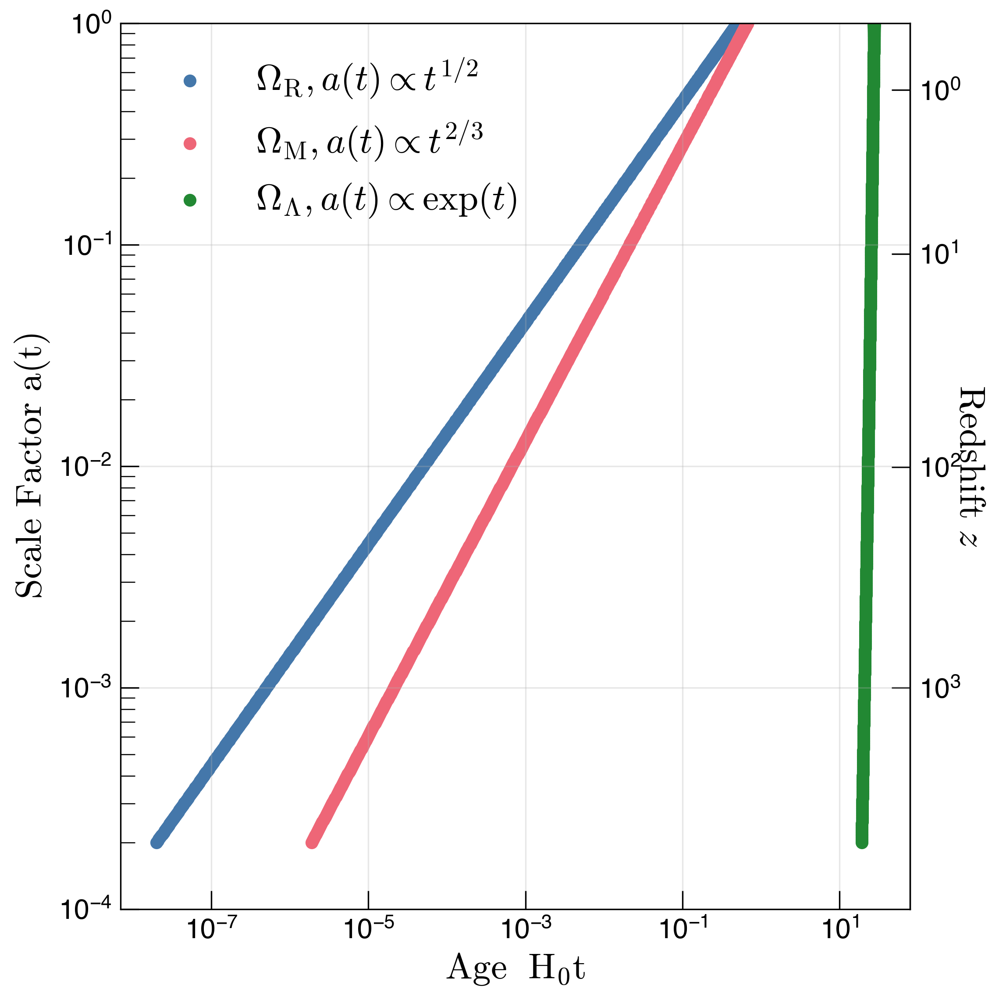

In [10]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)


_ = ax.scatter(time_age_Radiation, a_Radiation, label=Radiation_label)
_ = ax.scatter(time_age_Matter, a_Matter, label=Matter_label)
_ = ax.scatter(time_age_Lambda, a_Lambda, label=Lambda_label)

_ = ax.set_xlabel(r"$\rm{Age}\  \ H_0 t$", fontsize=20)
_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)

_ = ax.set_yscale('log')
_ = ax.set_xscale('log')

_ = ax.set_ylim(1e-4, 1e0)

ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
_ = ax2y.set_yticks([1e0, 1e1, 1e2, 1e3])
_ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=14, fontsize=20)


_ = ax.legend()

_ = ax.grid(alpha=0.3)

_ = fig.tight_layout()

_ = plt.savefig('BasicExpansion_LogLog.png', bbox_inches='tight', dpi=256)

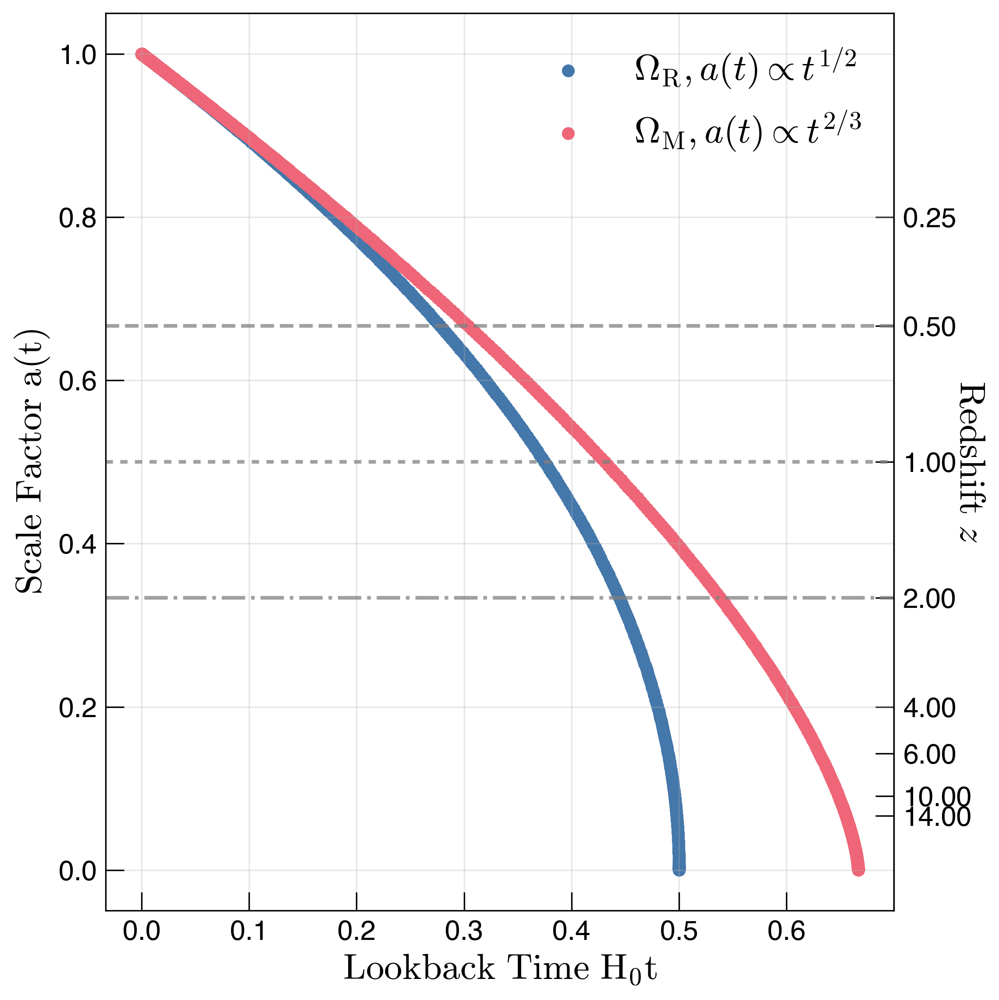

In [11]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

_ = ax.scatter(time_look_Radiation, a_Radiation, label=Radiation_label)
_ = ax.scatter(time_look_Matter, a_Matter, label=Matter_label)

_ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

# x_redshift = 0.80
# y_redshift = 0.68
# _ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.52
# _ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.38
# _ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

_ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)

ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
_ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
_ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8, fontsize=20)

_ = ax.legend()

_ = ax.grid(alpha=0.3)

_ = fig.tight_layout()

_ = plt.savefig('BasicExpansion_MatRad.png', bbox_inches='tight', dpi=256)

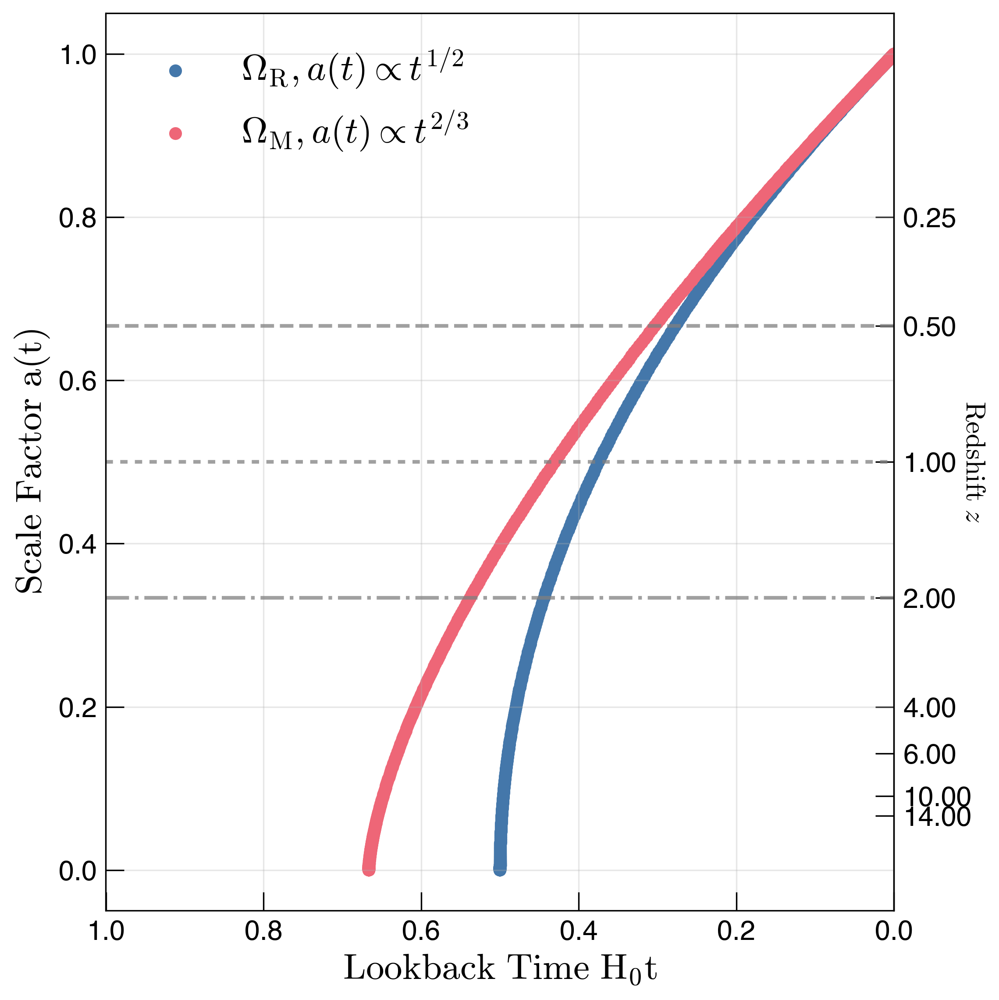

In [12]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

_ = ax.scatter(time_look_Radiation, a_Radiation, label=Radiation_label)
_ = ax.scatter(time_look_Matter, a_Matter, label=Matter_label)

_ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

# x_redshift = 0.80
# y_redshift = 0.68
# _ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.52
# _ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.38
# _ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

_ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)

_ = ax.set_xlim(1.0,0.)

ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
_ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
_ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8)

_ = ax.legend()
_ = ax.grid(alpha=0.3)


_ = fig.tight_layout()
_ = plt.savefig('BasicExpansion_MatRad_ZoomIn.png', bbox_inches='tight', dpi=256)

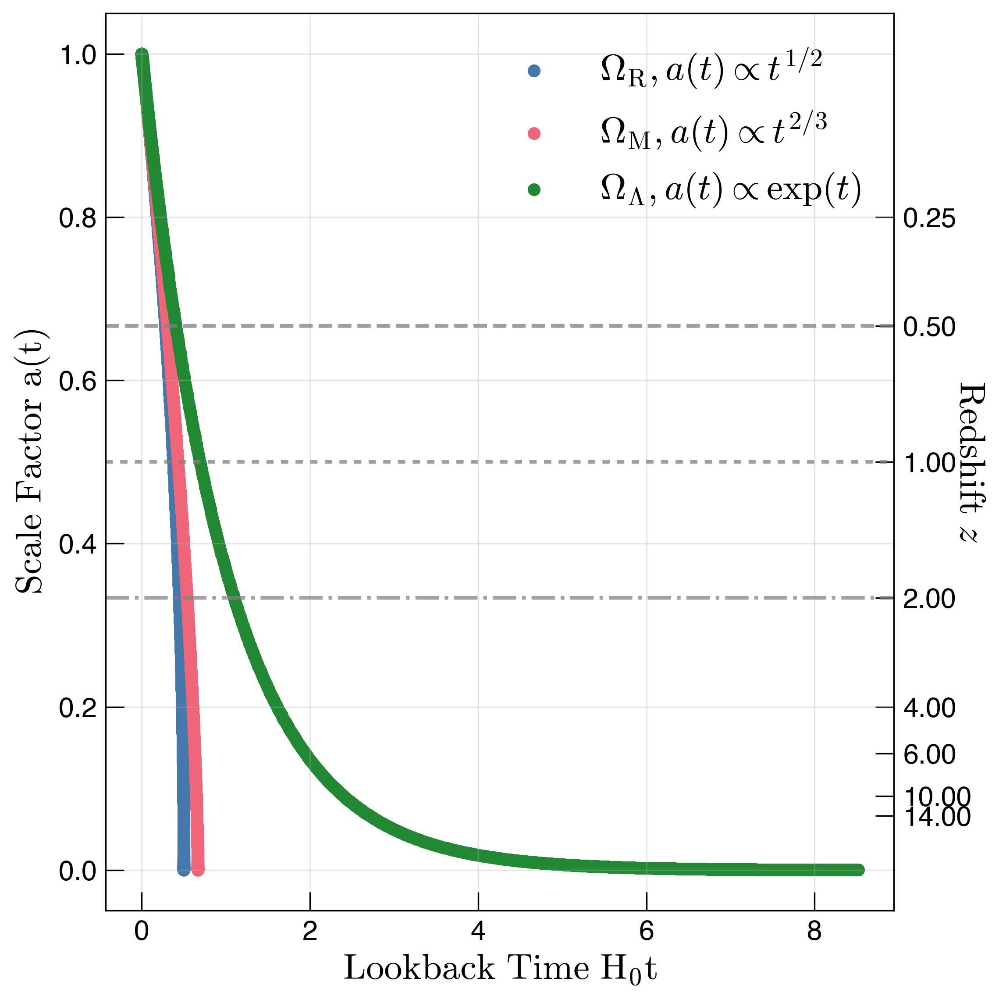

In [13]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

_ = ax.scatter(time_look_Radiation, a_Radiation, label=Radiation_label)
_ = ax.scatter(time_look_Matter, a_Matter, label=Matter_label)
_ = ax.scatter(time_look_Lambda, a_Lambda, label=Lambda_label)

_ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

# x_redshift = 0.80
# y_redshift = 0.68
# _ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.52
# _ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.38
# _ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

_ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)

ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
_ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
_ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8, fontsize=20)

_ = ax.legend()

_ = ax.grid(alpha=0.3)

_ = fig.tight_layout()

_ = plt.savefig('BasicExpansion_Exp.png', bbox_inches='tight', dpi=256)

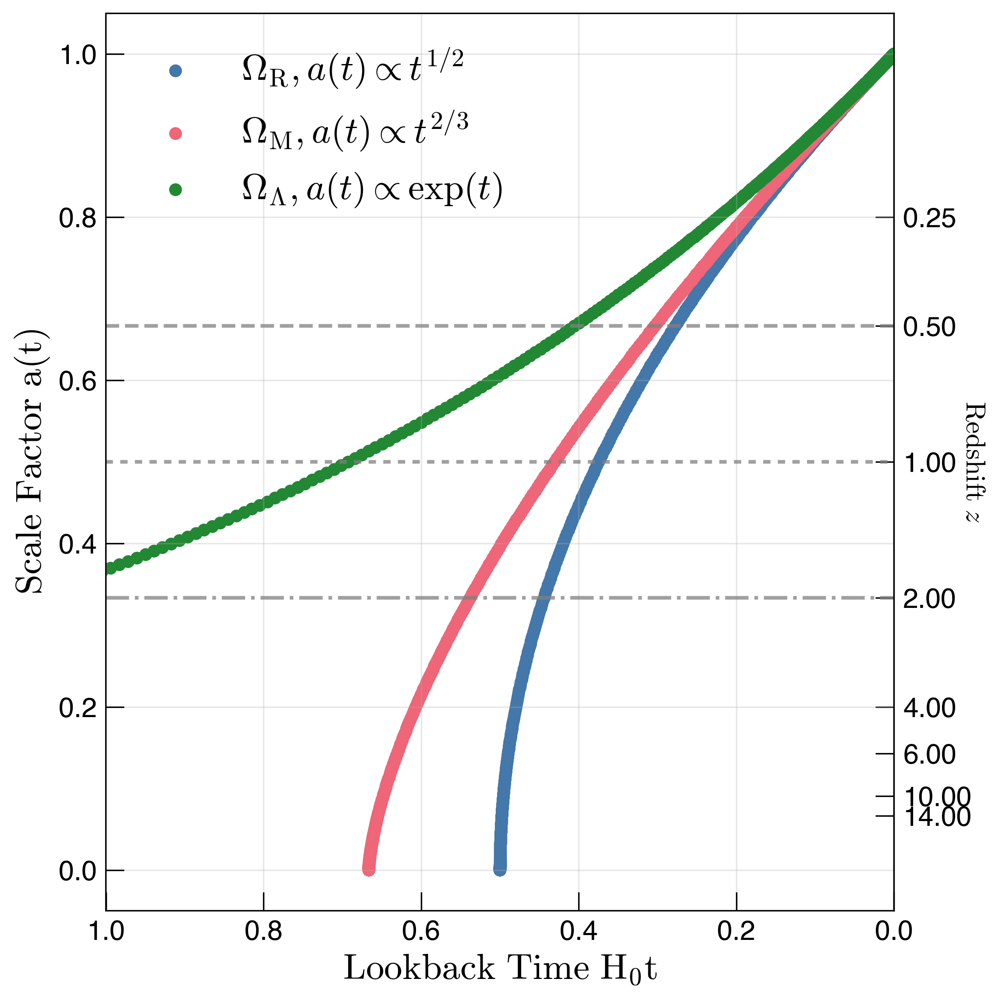

In [14]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

_ = ax.scatter(time_look_Radiation, a_Radiation, label=Radiation_label)
_ = ax.scatter(time_look_Matter, a_Matter, label=Matter_label)
_ = ax.scatter(time_look_Lambda, a_Lambda, label=Lambda_label)

_ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

# x_redshift = 0.80
# y_redshift = 0.68
# _ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.52
# _ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.38
# _ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

_ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)

_ = ax.set_xlim(1.0,0.)

ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
_ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
_ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8)

_ = ax.legend()
_ = ax.grid(alpha=0.3)


_ = fig.tight_layout()
_ = plt.savefig('BasicExpansion_ZoomIn.png', bbox_inches='tight', dpi=256)

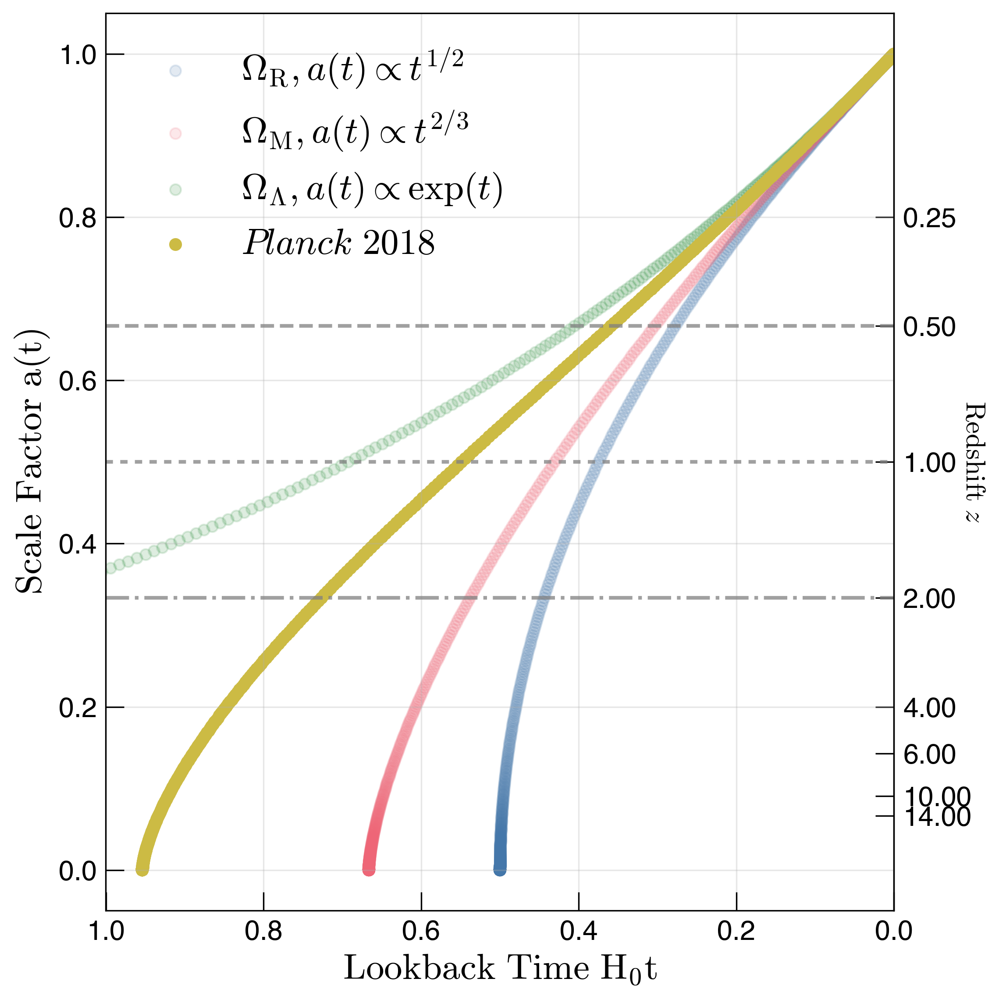

In [15]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

_ = ax.scatter(time_look_Radiation, a_Radiation, label=Radiation_label, alpha=0.15)
_ = ax.scatter(time_look_Matter, a_Matter, label=Matter_label, alpha=0.15)
_ = ax.scatter(time_look_Lambda, a_Lambda, label=Lambda_label, alpha=0.15)
_ = ax.scatter(time_look_Planck, a_Planck, label=Planck_label)

_ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

# x_redshift = 0.80
# y_redshift = 0.68
# _ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.52
# _ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

# x_redshift = 0.80
# y_redshift = 0.38
# _ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=0)

_ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)

_ = ax.set_xlim(1.0,0.)

ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
_ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
_ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8)

_ = ax.legend()
_ = ax.grid(alpha=0.3)


_ = fig.tight_layout()
_ = plt.savefig('BasicExpansionPlanck_ZoomIn.png', bbox_inches='tight', dpi=256)

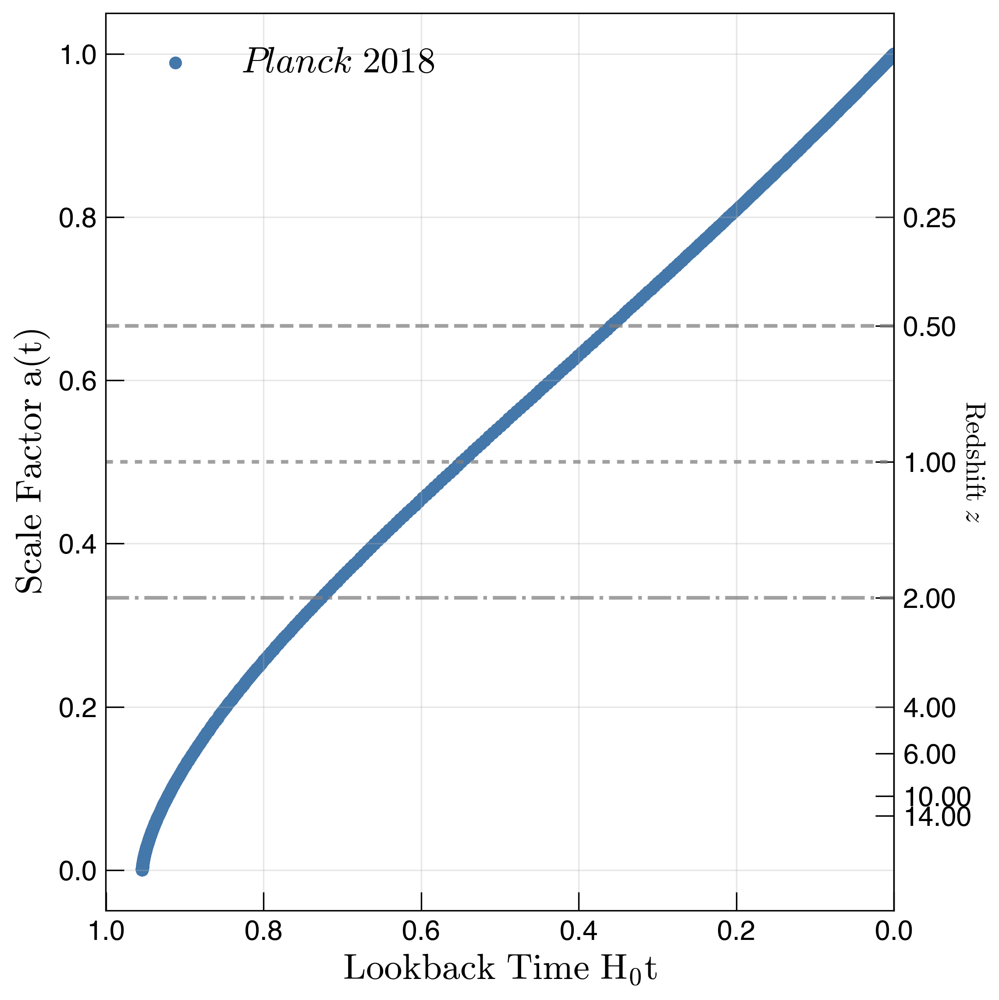

In [16]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

# _ = ax.scatter(time_look_Radiation, a_Radiation, alpha=0.)
# _ = ax.scatter(time_look_Matter, a_Matter, alpha=0.)
# _ = ax.scatter(time_look_Lambda, a_Lambda, alpha=0.)
_ = ax.scatter(time_look_Planck, a_Planck, label=Planck_label)

_ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

_ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)

_ = ax.set_xlim(1.0,0.)

ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
_ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
_ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8)

_ = ax.legend()
_ = ax.grid(alpha=0.3)


_ = fig.tight_layout()
_ = plt.savefig('ExpansionPlanck_ZoomIn.png', bbox_inches='tight', dpi=256)

$$
\rho \propto a^{-3(1 + w)}
$$

$$
\log_{10} \rho = -3(1 + w) \log_{10} a
$$


In [17]:
Lambda_label = r'$\Omega_{\Lambda}$'
Radiation_label = r'$\Omega_{\rm{R}}$'
Matter_label = r'$\Omega_{\rm{M}}$'

$$
a = \frac{1}{1+z} \rightarrow \log_{10}\left( a \right) = \log_{10}\left( \frac{1}{1+z} \right)
$$

$$
\log_{10}\left( 1+z \right) = - \log_{10}\left( a \right) \& \log_{10}\left( a \right) = -\log_{10}\left( 1+z \right)
$$

In [18]:
def la2l1z(la):
    return -1. * la

def l1z2la(l1z):
    return -1. * l1z



In [19]:
OmegaM, OmegaL = 0.315, 0.685

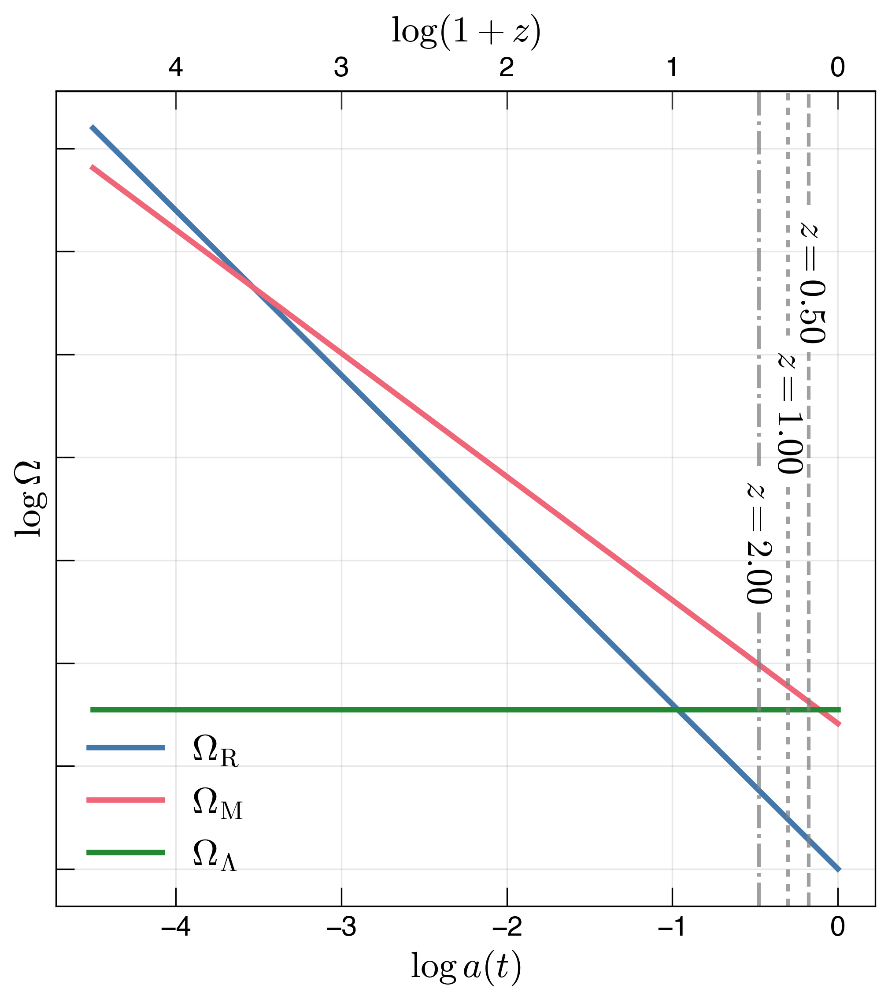

In [20]:
l_scale_factor = np.linspace(-4.5,0)

w_Rad = 1. / 3.
w_Matter = 0.
w_Lambda = -1.

l_density_Radiation = ((l_scale_factor ) * (-3.) * (1. + w_Rad)) 
l_density_RM_eq = np.log10(a_radmateq) * (-3.) * (1. + w_Rad)
A = l_density_RM_eq - np.log10(a_radmateq) * (-3.)

l_density_Matter = ((l_scale_factor ) * (-3.) * (1. + w_Matter)) + A
l_density_ML_eq =  np.log10((OmegaL / OmegaM)**(1./(3. * w_Lambda)))
B = (l_density_ML_eq * (-3.) + A) - l_density_ML_eq * (-3. * (1. + w_Lambda))
l_density_Lambda = ((l_scale_factor ) * (-3.) * (1. + w_Lambda)) + B


fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

# _ = ax.axvline(np.log10(a_radmateq), label='rad-mat eq', ls='--', c='k')
# _ = ax.axvline(np.log10(a_matDEeq), label='mat-DE eq', ls='-.', c='k')

_ = ax.plot(l_scale_factor, l_density_Radiation, label=Radiation_label)
_ = ax.plot(l_scale_factor, l_density_Matter, label=Matter_label)
_ = ax.plot(l_scale_factor, l_density_Lambda, label=Lambda_label)

_ = ax.axvline(np.log10(a_lookref_0), ymin=0.86, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_0), ymax=0.68, c='gray', ls='--', lw=2, alpha=0.75)

_ = ax.axvline(np.log10(a_lookref_1), ymin=0.70, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_1), ymax=0.52, c='gray', ls=':', lw=2, alpha=0.75)

_ = ax.axvline(np.log10(a_lookref_2), ymin = 0.54, c='gray', ls='-.', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_2), ymax = 0.36, c='gray', ls='-.', lw=2, alpha=0.75)

x_redshift = 0.9
y_redshift = 0.7
_ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

x_redshift = 0.873
y_redshift = 0.54
_ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

x_redshift = 0.835
y_redshift = 0.38
_ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

_ = ax.set_xlabel(r'$\log a(t)$', fontsize=20)
_ = ax.set_ylabel(r'$\log \Omega$', fontsize=20)

ax2x = ax.secondary_xaxis('top', functions=(la2l1z, l1z2la))
_ = ax2x.set_xlabel(r"$\log (1 + z)$", fontsize=20, labelpad=8)

_ = ax.legend()
_ = ax.grid(alpha=0.3)

_ = ax.tick_params(which='both', axis='both', labelbottom=True, labelleft=False)

_ = plt.savefig('CosmoBudget.png', bbox_inches='tight', dpi=256)

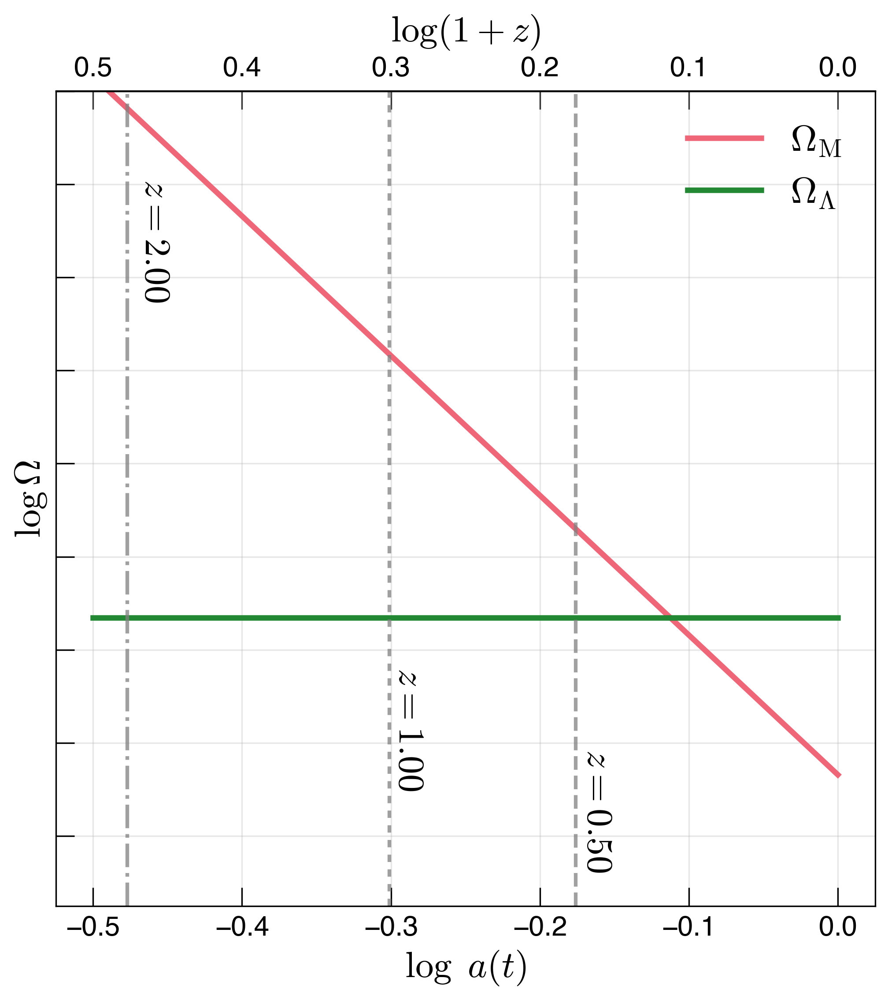

In [21]:
l_scale_factor = np.linspace(-0.5,0)

w_Rad = 1. / 3.
w_Matter = 0.
w_Lambda = -1.

l_density_Radiation = ((l_scale_factor ) * (-3.) * (1. + w_Rad)) 
l_density_RM_eq = np.log10(a_radmateq) * (-3.) * (1. + w_Rad)
A = l_density_RM_eq - np.log10(a_radmateq) * (-3.)

l_density_Matter = ((l_scale_factor ) * (-3.) * (1. + w_Matter)) + A
l_density_ML_eq =  np.log10((OmegaL / OmegaM)**(1./(3. * w_Lambda)))


fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

# _ = ax.axvline(np.log10(a_radmateq), label='rad-mat eq', ls='--', c='k')
# _ = ax.axvline(np.log10(a_matDEeq), label='mat-DE eq', ls='-.', c='k')

_ = ax.plot(l_scale_factor, l_density_Radiation)
_ = ax.plot(l_scale_factor, l_density_Matter, label=Matter_label)
_ = ax.plot(l_scale_factor, l_density_Lambda, label=Lambda_label)


_ = ax.axvline(np.log10(a_lookref_0), c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_1), c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_2), c='gray', ls='-.', lw=2, alpha=0.75)

x_redshift = 0.64
y_redshift = 0.05
_ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

x_redshift = 0.41
y_redshift = 0.15
_ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

x_redshift = 0.10
y_redshift = 0.75
_ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)


_ = ax.set_xlabel(r"$\log\ a(t) $", fontsize=20)
_ = ax.set_ylabel(r'$\log \Omega$', fontsize=20)

_ = ax.set_ylim(3.25,5.)

ax2x = ax.secondary_xaxis('top', functions=(la2l1z, l1z2la))
_ = ax2x.set_xlabel(r"$\log (1+z)$", fontsize=20, labelpad=8)

_ = ax.legend(loc='upper right')
_ = ax.grid(alpha=0.3)

_ = ax.tick_params(which='both', axis='both', labelbottom=True, labelleft=False)

_ = plt.savefig('CosmoBudget_ZoomIn.png', bbox_inches='tight', dpi=256)

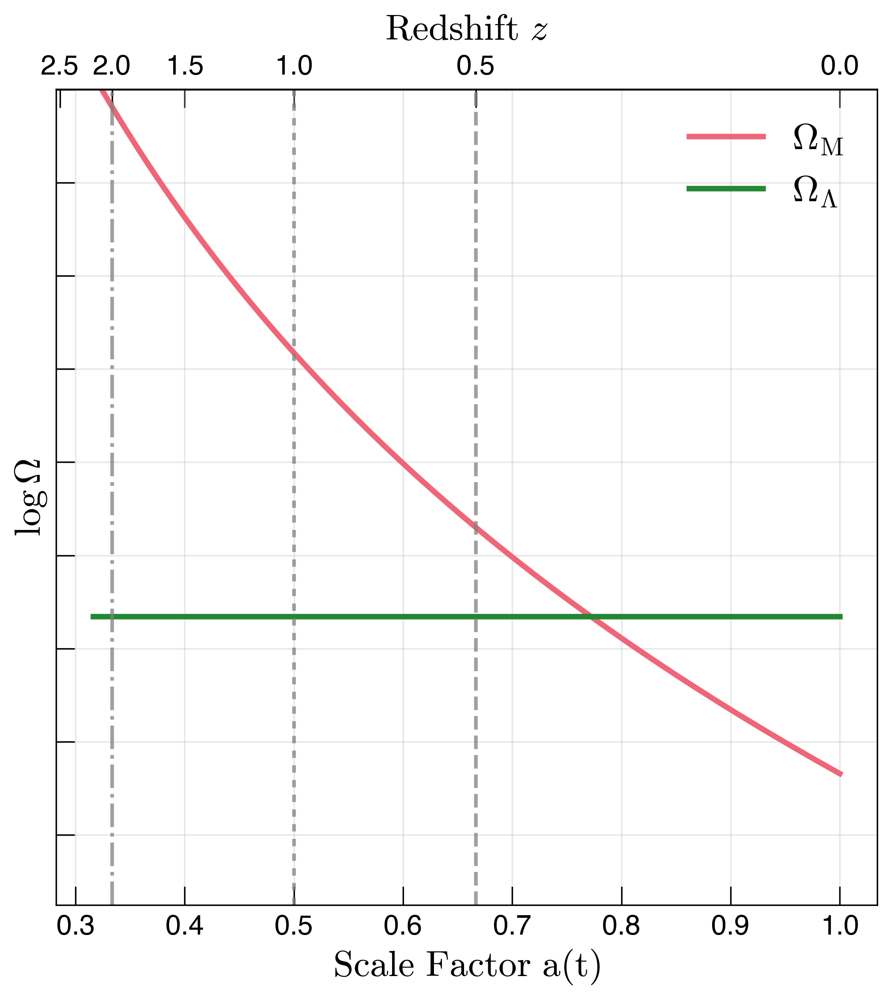

In [22]:
l_scale_factor = np.linspace(-0.5,0)

w_Rad = 1. / 3.
w_Matter = 0.
w_Lambda = -1.

l_density_Radiation = ((l_scale_factor ) * (-3.) * (1. + w_Rad)) 
l_density_RM_eq = np.log10(a_radmateq) * (-3.) * (1. + w_Rad)
A = l_density_RM_eq - np.log10(a_radmateq) * (-3.)

l_density_Matter = ((l_scale_factor ) * (-3.) * (1. + w_Matter)) + A
l_density_ML_eq =  np.log10((OmegaL / OmegaM)**(1./(3. * w_Lambda)))


fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

# _ = ax.axvline(np.log10(a_radmateq), label='rad-mat eq', ls='--', c='k')
# _ = ax.axvline(np.log10(a_matDEeq), label='mat-DE eq', ls='-.', c='k')

_ = ax.plot(10**l_scale_factor, l_density_Radiation)
_ = ax.plot(10**l_scale_factor, l_density_Matter, label=Matter_label)
_ = ax.plot(10**l_scale_factor, l_density_Lambda, label=Lambda_label)


_ = ax.axvline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axvline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axvline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

_ = ax.set_xlabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)
_ = ax.set_ylabel(r'$\log \Omega$', fontsize=20)

_ = ax.set_ylim(3.25,5.)

ax2x = ax.secondary_xaxis('top', functions=(a2z, z2a))
_ = ax2x.set_xlabel(r"$\rm{Redshift}$" + r"$\ z$", fontsize=20, labelpad=8)

_ = ax.legend(loc='upper right')
_ = ax.grid(alpha=0.3)

_ = ax.tick_params(which='both', axis='both', labelbottom=True, labelleft=False)

_ = plt.savefig('CosmoBudget_ZoomIn_Linear.png', bbox_inches='tight', dpi=256)

In [23]:
Lambda_label = r'$w_{\Lambda}$'
Radiation_label = r'$w_{\rm{R}}$'
Matter_label = r'$w_{\rm{M}}$'
DE_label = r'$w_{\rm{DE}}$'

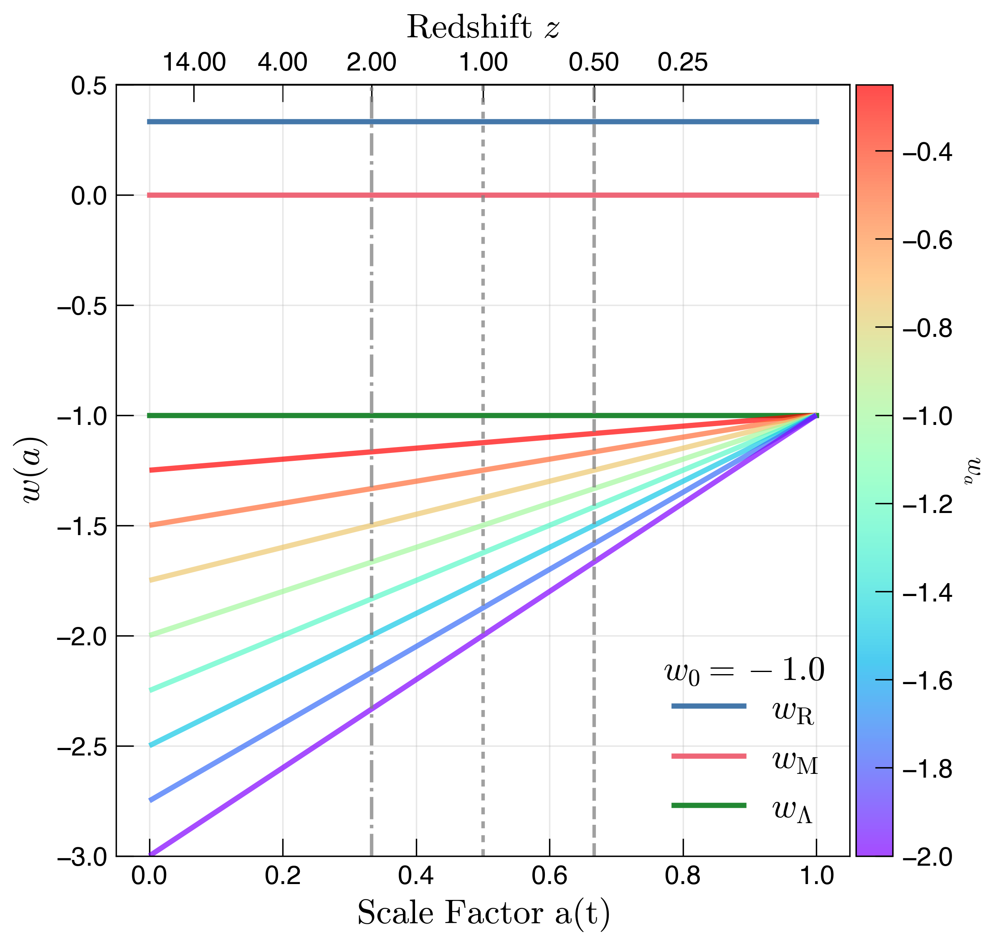

In [24]:
scale_factor = np.linspace(0.,1.)

def_arr = np.ones_like(scale_factor)
w_Radiation = 1. / 3. * def_arr
w_Matter = 0. * def_arr
w_Lambda = -1. * def_arr

w0 = -1.0
wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])
lines_DE = []

for wa in wa_all:
    w_DE = w0 + wa * (1. - scale_factor)
    
    line_elm = np.zeros((scale_factor.size, 2))
    line_elm[:,0] = scale_factor
    line_elm[:,1] = w_DE
    _ = lines_DE.append(line_elm)

linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)


fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

_ = ax.plot(scale_factor, w_Radiation, label=Radiation_label)
_ = ax.plot(scale_factor, w_Matter, label=Matter_label)
_ = ax.plot(scale_factor, w_Lambda, label=Lambda_label)

im = ax.add_collection(linescollec_DE)
divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("right", size="5%", pad=0.05)
_ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="vertical")

cbar_str = r"$w_a$"
_ = cbar_ax.set_ylabel(cbar_str, rotation=270)
_ = cbar_ax.yaxis.set_label_position('right')
_ = cbar_ax.yaxis.labelpad = 20

w0_str = rf"$w_0 = {w0:.1f}$"
x_redshift = 0.77
y_redshift = -2.2
_ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)



_ = ax.axvline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axvline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axvline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

# x_redshift = 0.9
# y_redshift = 0.7
# _ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=270)

# x_redshift = 0.873
# y_redshift = 0.54
# _ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=270)

# x_redshift = 0.835
# y_redshift = 0.38
# _ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
#                 fontsize=20, rotation=270)




_ = ax.set_xlabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)
_ = ax.set_ylabel(r'$w(a)$', fontsize=20)

ax2x = ax.secondary_xaxis('top', functions=(a2z, z2a))
_ = ax2x.set_xticks([0.25, 0.5, 1., 2., 4., 14.])
_ = ax2x.set_xlabel(r"$\rm{Redshift}$" + r"$\ z$", fontsize=20, labelpad=8)

_ = ax.set_ylim(-3., 0.5)

_ = ax.legend(loc='lower right')
_ = ax.grid(alpha=0.3)

_ = plt.savefig('wEvolution.png', bbox_inches='tight', dpi=256)

In [25]:
Lambda_label = r'$\Omega_{\Lambda}$'
Radiation_label = r'$\Omega_{\rm{R}}$'
Matter_label = r'$\Omega_{\rm{M}}$'

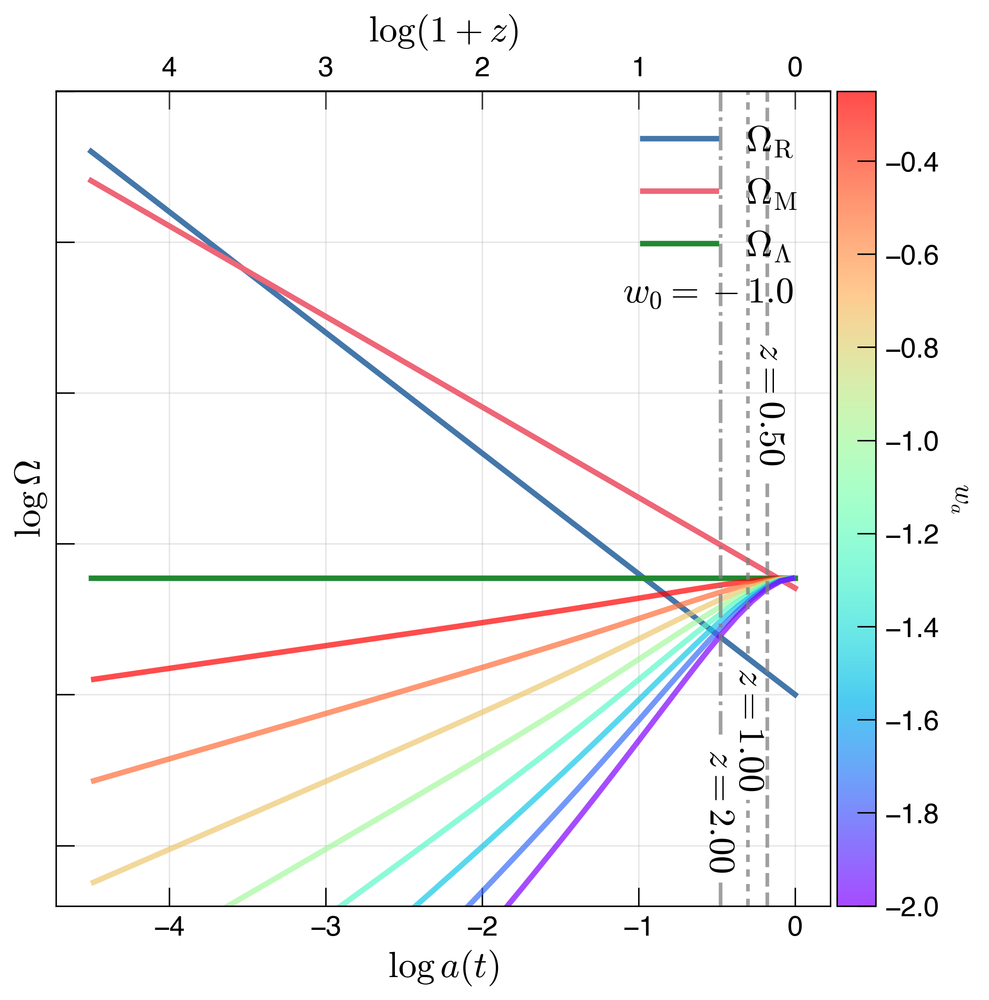

In [26]:
l_scale_factor = np.linspace(-4.5,0)

w_Rad = 1. / 3.
w_Matter = 0.
w_Lambda = -1.

l_density_Radiation = ((l_scale_factor ) * (-3.) * (1. + w_Rad)) 
l_density_RM_eq = np.log10(a_radmateq) * (-3.) * (1. + w_Rad)
A = l_density_RM_eq - np.log10(a_radmateq) * (-3.)

l_density_Matter = ((l_scale_factor ) * (-3.) * (1. + w_Matter)) + A
l_density_ML_eq =  np.log10((OmegaL / OmegaM)**(1./(3. * w_Lambda)))
B = (l_density_ML_eq * (-3.) + A) - l_density_ML_eq * (-3. * (1. + w_Lambda))
l_density_Lambda = ((l_scale_factor ) * (-3.) * (1. + w_Lambda)) + B


w0 = -1.0
wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])
lines_DE = []

for wa in wa_all:
    w_DE = w0 + wa * (1. - 10**(l_scale_factor))
    B = (l_density_ML_eq * (-3.) + A) - l_density_ML_eq * (-3. * (1. + w_Lambda))
    l_density_DE = ((l_scale_factor ) * (-3) * (1 + w_DE)) + B
    
    line_elm = np.zeros((scale_factor.size, 2))
    line_elm[:,0] = l_scale_factor
    line_elm[:,1] = l_density_DE
    _ = lines_DE.append(line_elm)

linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)


fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

# _ = ax.axvline(np.log10(a_radmateq), label='rad-mat eq', ls='--', c='k')
# _ = ax.axvline(np.log10(a_matDEeq), label='mat-DE eq', ls='-.', c='k')

_ = ax.plot(l_scale_factor, l_density_Radiation, label=Radiation_label)
_ = ax.plot(l_scale_factor, l_density_Matter, label=Matter_label)
_ = ax.plot(l_scale_factor, l_density_Lambda, label=Lambda_label)


im = ax.add_collection(linescollec_DE)
divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("right", size="5%", pad=0.05)
_ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="vertical")

cbar_str = r"$w_a$"
_ = cbar_ax.set_ylabel(cbar_str, rotation=270)
_ = cbar_ax.yaxis.set_label_position('right')
_ = cbar_ax.yaxis.labelpad = 20

w0_str = rf"$w_0 = {w0:.1f}$"
x_redshift = -1.1
y_redshift = 13.
_ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)

_ = ax.axvline(np.log10(a_lookref_0), ymin=0.70, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_0), ymax=0.52, c='gray', ls='--', lw=2, alpha=0.75)

_ = ax.axvline(np.log10(a_lookref_1), ymin=0.31, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_1), ymax=0.13, c='gray', ls=':', lw=2, alpha=0.75)

_ = ax.axvline(np.log10(a_lookref_2), ymin = 0.21, c='gray', ls='-.', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_2), ymax = 0.03, c='gray', ls='-.', lw=2, alpha=0.75)

x_redshift = 0.9
y_redshift = 0.55
_ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

x_redshift = 0.873
y_redshift = 0.15
_ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

x_redshift = 0.835
y_redshift = 0.05
_ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

_ = ax.set_xlabel(r'$\log a(t)$', fontsize=20)
_ = ax.set_ylabel(r'$\log \Omega$', fontsize=20)

_ = ax.set_ylim(-7,20.)

ax2x = ax.secondary_xaxis('top', functions=(la2l1z, l1z2la))
_ = ax2x.set_xlabel(r"$\log (1 + z)$", fontsize=20, labelpad=8)

_ = ax.legend(loc='upper right')
_ = ax.grid(alpha=0.3)

_ = ax.tick_params(which='both', axis='both', labelbottom=True, labelleft=False)

_ = plt.savefig('CosmoBudget_w0wa.png', bbox_inches='tight', dpi=256)

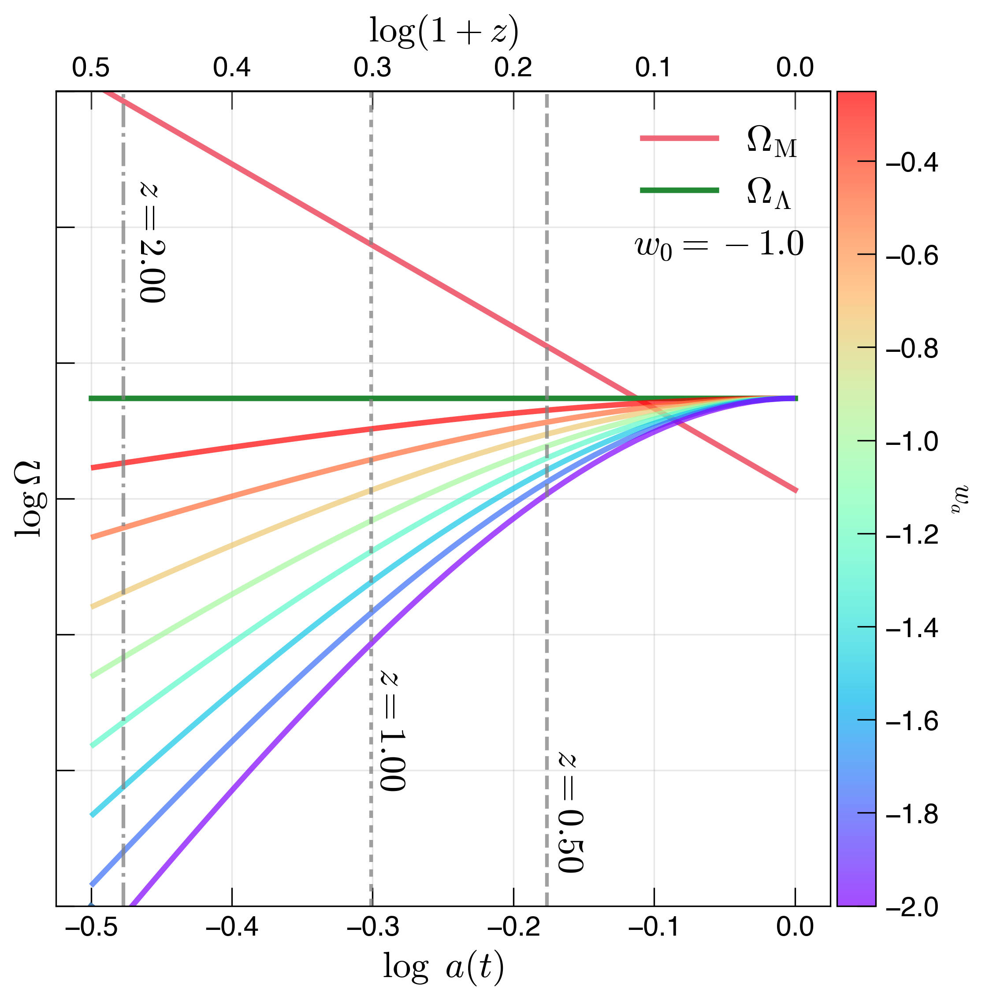

In [27]:
l_scale_factor = np.linspace(-0.5,0)

w_Rad = 1. / 3.
w_Matter = 0.
w_Lambda = -1.

l_density_Radiation = ((l_scale_factor ) * (-3.) * (1. + w_Rad)) 
l_density_RM_eq = np.log10(a_radmateq) * (-3.) * (1. + w_Rad)
A = l_density_RM_eq - np.log10(a_radmateq) * (-3.)

l_density_Matter = ((l_scale_factor ) * (-3.) * (1. + w_Matter)) + A
l_density_ML_eq =  np.log10((OmegaL / OmegaM)**(1./(3. * w_Lambda)))
B = (l_density_ML_eq * (-3.) + A) - l_density_ML_eq * (-3. * (1. + w_Lambda))
l_density_Lambda = ((l_scale_factor ) * (-3.) * (1. + w_Lambda)) + B

w0 = -1.0
wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])
lines_DE = []

for wa in wa_all:
    w_DE = w0 + wa * (1. - 10**(l_scale_factor))
    B = (l_density_ML_eq * (-3.) + A) - l_density_ML_eq * (-3. * (1. + w_Lambda))
    l_density_DE = ((l_scale_factor ) * (-3) * (1 + w_DE)) + B
    
    line_elm = np.zeros((scale_factor.size, 2))
    line_elm[:,0] = l_scale_factor
    line_elm[:,1] = l_density_DE
    _ = lines_DE.append(line_elm)

linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)


fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

# _ = ax.axvline(np.log10(a_radmateq), label='rad-mat eq', ls='--', c='k')
# _ = ax.axvline(np.log10(a_matDEeq), label='mat-DE eq', ls='-.', c='k')

_ = ax.plot(l_scale_factor, l_density_Radiation)
_ = ax.plot(l_scale_factor, l_density_Matter, label=Matter_label)
_ = ax.plot(l_scale_factor, l_density_Lambda, label=Lambda_label)


im = ax.add_collection(linescollec_DE)
divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("right", size="5%", pad=0.05)
_ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="vertical")

cbar_str = r"$w_a$"
_ = cbar_ax.set_ylabel(cbar_str, rotation=270)
_ = cbar_ax.yaxis.set_label_position('right')
_ = cbar_ax.yaxis.labelpad = 20

w0_str = rf"$w_0 = {w0:.1f}$"
x_redshift = -0.115
y_redshift = 4.4
_ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)

_ = ax.axvline(np.log10(a_lookref_0), c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_1), c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axvline(np.log10(a_lookref_2), c='gray', ls='-.', lw=2, alpha=0.75)

x_redshift = 0.64
y_redshift = 0.05
_ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

x_redshift = 0.41
y_redshift = 0.15
_ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)

x_redshift = 0.10
y_redshift = 0.75
_ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), xycoords='axes fraction', 
                fontsize=20, rotation=270)


_ = ax.set_xlabel(r"$\log\ a(t) $", fontsize=20)
_ = ax.set_ylabel(r'$\log \Omega$', fontsize=20)

_ = ax.set_ylim(2.,5.)

ax2x = ax.secondary_xaxis('top', functions=(la2l1z, l1z2la))
_ = ax2x.set_xlabel(r"$\log (1+z)$", fontsize=20, labelpad=8)

_ = ax.legend(loc='upper right')
_ = ax.grid(alpha=0.3)

_ = ax.tick_params(which='both', axis='both', labelbottom=True, labelleft=False)

_ = plt.savefig('CosmoBudget_w0wa_ZoomIn.png', bbox_inches='tight', dpi=256)

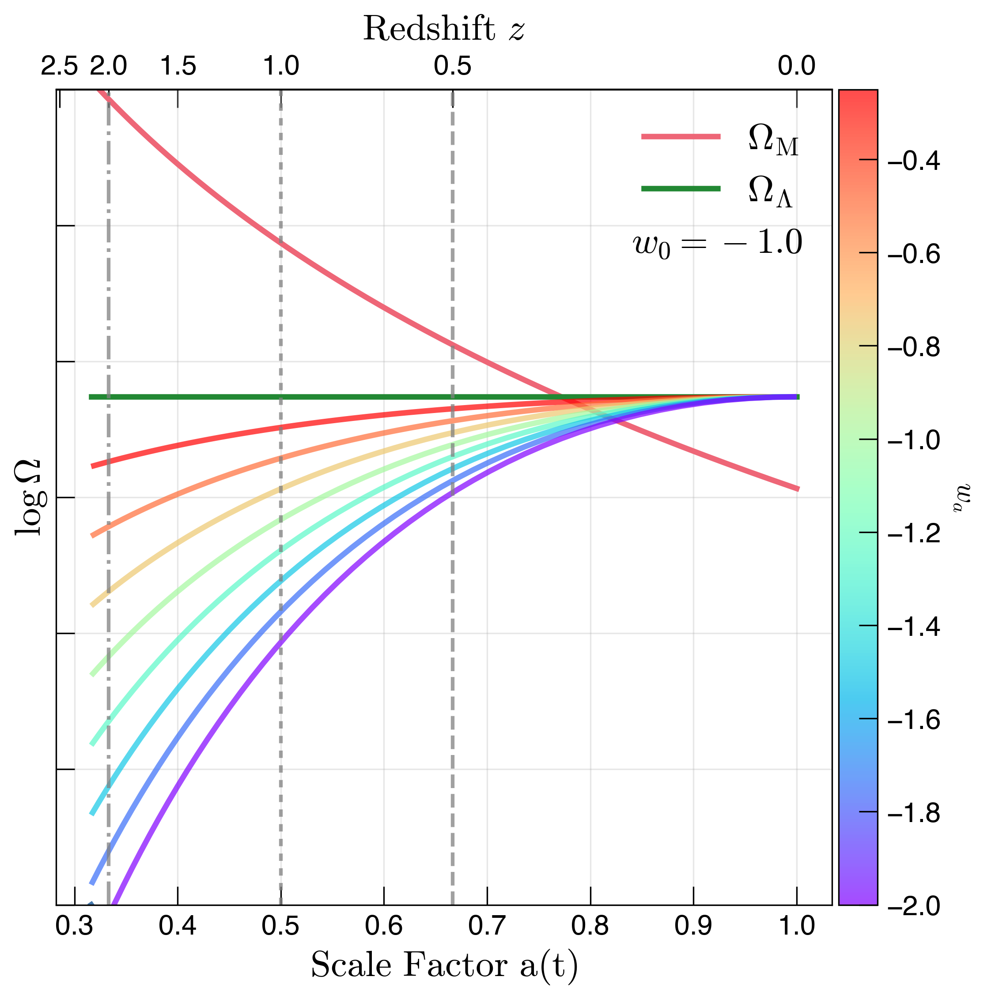

In [28]:
l_scale_factor = np.linspace(-0.5,0)

w_Rad = 1. / 3.
w_Matter = 0.
w_Lambda = -1.

l_density_Radiation = ((l_scale_factor ) * (-3.) * (1. + w_Rad)) 
l_density_RM_eq = np.log10(a_radmateq) * (-3.) * (1. + w_Rad)
A = l_density_RM_eq - np.log10(a_radmateq) * (-3.)

l_density_Matter = ((l_scale_factor ) * (-3.) * (1. + w_Matter)) + A
l_density_ML_eq =  np.log10((OmegaL / OmegaM)**(1./(3. * w_Lambda)))
B = (l_density_ML_eq * (-3.) + A) - l_density_ML_eq * (-3. * (1. + w_Lambda))
l_density_Lambda = ((l_scale_factor ) * (-3.) * (1. + w_Lambda)) + B

w0 = -1.0
wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])
lines_DE = []

for wa in wa_all:
    w_DE = w0 + wa * (1. - 10**(l_scale_factor))
    B = (l_density_ML_eq * (-3.) + A) - l_density_ML_eq * (-3. * (1. + w_Lambda))
    l_density_DE = ((l_scale_factor ) * (-3) * (1 + w_DE)) + B
    
    line_elm = np.zeros((scale_factor.size, 2))
    line_elm[:,0] = 10**l_scale_factor
    line_elm[:,1] = l_density_DE
    _ = lines_DE.append(line_elm)

linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)


fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

# _ = ax.axvline(np.log10(a_radmateq), label='rad-mat eq', ls='--', c='k')
# _ = ax.axvline(np.log10(a_matDEeq), label='mat-DE eq', ls='-.', c='k')

_ = ax.plot(10**l_scale_factor, l_density_Radiation)
_ = ax.plot(10**l_scale_factor, l_density_Matter, label=Matter_label)
_ = ax.plot(10**l_scale_factor, l_density_Lambda, label=Lambda_label)


im = ax.add_collection(linescollec_DE)
divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("right", size="5%", pad=0.05)
_ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="vertical")

cbar_str = r"$w_a$"
_ = cbar_ax.set_ylabel(cbar_str, rotation=270)
_ = cbar_ax.yaxis.set_label_position('right')
_ = cbar_ax.yaxis.labelpad = 20

w0_str = rf"$w_0 = {w0:.1f}$"
x_redshift = 0.84
y_redshift = 4.4
_ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)

_ = ax.axvline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axvline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axvline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

_ = ax.set_xlabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)
_ = ax.set_ylabel(r'$\log \Omega$', fontsize=20)

_ = ax.set_ylim(2.,5.)

ax2x = ax.secondary_xaxis('top', functions=(a2z, z2a))
_ = ax2x.set_xlabel(r"$\rm{Redshift}$" + r"$\ z$", fontsize=20, labelpad=8)

_ = ax.legend(loc='upper right')
_ = ax.grid(alpha=0.3)

_ = ax.tick_params(which='both', axis='both', labelbottom=True, labelleft=False)

_ = plt.savefig('CosmoBudget_w0wa_ZoomIn_Linear.png', bbox_inches='tight', dpi=256)

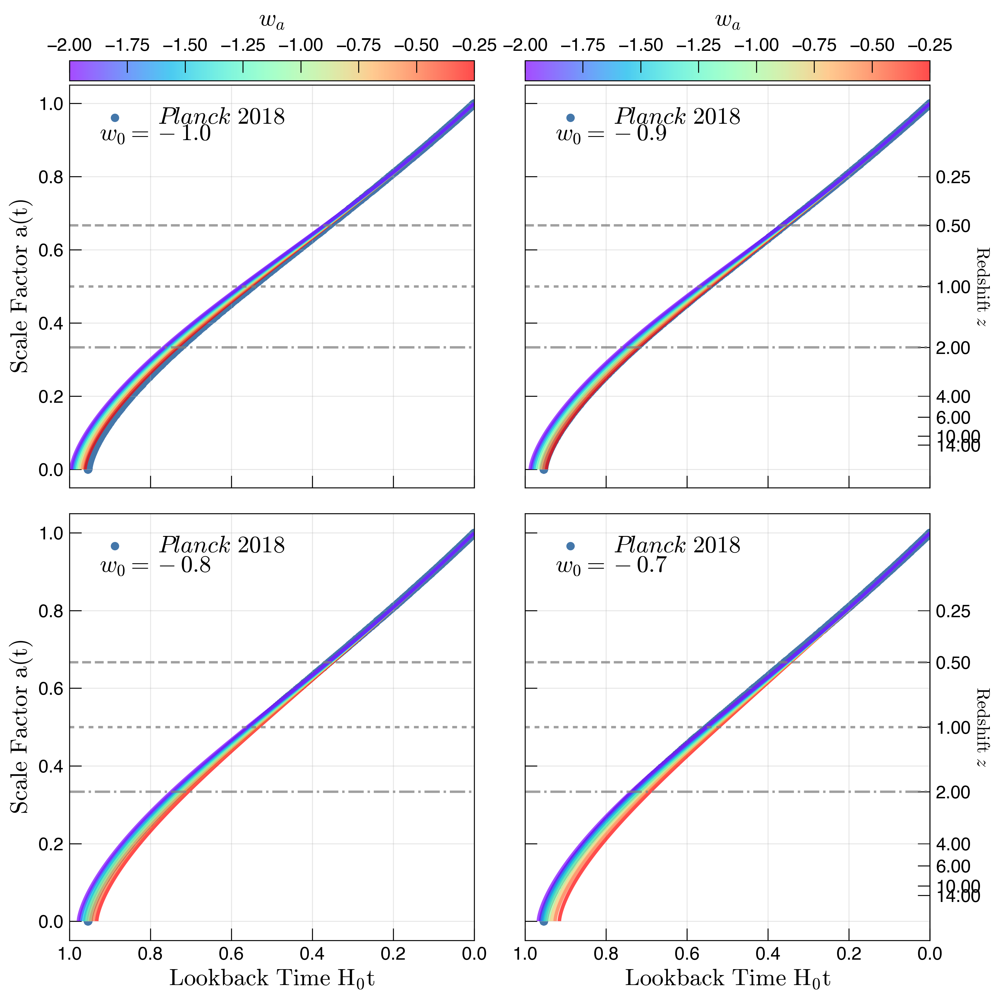

In [29]:
fig, ax_all = plt.subplots(figsize=(12,12), nrows=2, ncols=2)

w0_all = np.array([-1.0, -0.9, -0.8, -0.7])
wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])


# ax_all_flat
for a, ax in enumerate(ax_all.flatten()):
#     _ = ax.scatter(time_look_Matter, a_Matter, label=Matter_label)
#     _ = ax.scatter(time_look_Radiation, a_Radiation, label=Radiation_label)
#     _ = ax.scatter(time_look_Lambda, a_Lambda, label=Lambda_label)
    _ = ax.scatter(time_look_Planck, a_Planck, label=Planck_label)


    w0 = w0_all[a]    
    lines_DE = []

    for i, wa in enumerate(wa_all):
        table_fname_w0wa = f"expansion/Planck_w0_{a:.0f}_wa_{i:.0f}Fine.txt"
        table_w0wa = np.loadtxt(table_fname_w0wa, skiprows=10, delimiter =',')

        z_w0wa = table_w0wa[:,0]
        l_z_w0wa = table_w0wa[:,1]
        a_w0wa = table_w0wa[:,2]
        time_look_w0wa = table_w0wa[:,3]
        time_age_w0wa = table_w0wa[:,4]

        line_elm = np.zeros((time_look_w0wa.size, 2))
        line_elm[:,0] = time_look_w0wa
        line_elm[:,1] = a_w0wa
        _ = lines_DE.append(line_elm)

    linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)
    im = ax.add_collection(linescollec_DE)
    if (a < 2):
        divider = make_axes_locatable(ax)
        cbar_ax = divider.append_axes("top", size="5%", pad=0.05)
        _ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="horizontal")

        cbar_str = r"$w_a$"
        _ = cbar_ax.set_xlabel(cbar_str, rotation=0, fontsize=20)
        _ = cbar_ax.xaxis.set_label_position('top')
        _ = cbar_ax.xaxis.set_ticks_position('top')
        _ = cbar_ax.xaxis.labelpad = 10

    w0_str = rf"$w_0 = {w0:.1f}$"
    x_redshift = 0.925
    y_redshift = 0.90
    _ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)
    
    _ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
    _ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
    _ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

    if (a > 1):
        _ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
    else:
        _ = ax.tick_params(which='both', axis='both', labelbottom=False)
    
    _ = ax.set_xlim(1.0,0.)

    if not (a % 2):
        _ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)
    else:
        _ = ax.tick_params(which='both', axis='both', labelleft=False)
        
        ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
        _ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
        _ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8)

    _ = ax.legend(loc='upper left')
    _ = ax.grid(alpha=0.3)


_ = fig.tight_layout()
_ = plt.savefig('BasicExpansionPlanck_w0wa_ZoomIn.png', bbox_inches='tight', dpi=256)

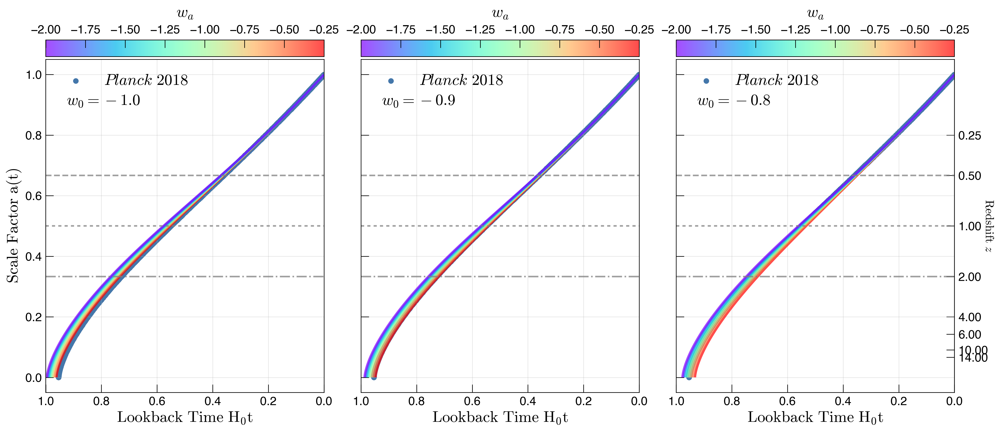

In [30]:
fig, ax_all = plt.subplots(figsize=(18,8), nrows=1, ncols=3)

w0_all = np.array([-1.0, -0.9, -0.8])
wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])


for a, ax in enumerate(ax_all.flatten()):
    _ = ax.scatter(time_look_Planck, a_Planck, label=Planck_label)


    w0 = w0_all[a]    
    lines_DE = []

    for i, wa in enumerate(wa_all):
        table_fname_w0wa = f"expansion/Planck_w0_{a:.0f}_wa_{i:.0f}Fine.txt"
        table_w0wa = np.loadtxt(table_fname_w0wa, skiprows=10, delimiter =',')

        z_w0wa = table_w0wa[:,0]
        l_z_w0wa = table_w0wa[:,1]
        a_w0wa = table_w0wa[:,2]
        time_look_w0wa = table_w0wa[:,3]
        time_age_w0wa = table_w0wa[:,4]

        line_elm = np.zeros((time_look_w0wa.size, 2))
        line_elm[:,0] = time_look_w0wa
        line_elm[:,1] = a_w0wa
        _ = lines_DE.append(line_elm)

    linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)
    im = ax.add_collection(linescollec_DE)
    divider = make_axes_locatable(ax)
    cbar_ax = divider.append_axes("top", size="5%", pad=0.05)
    _ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="horizontal")

    cbar_str = r"$w_a$"
    _ = cbar_ax.set_xlabel(cbar_str, rotation=0, fontsize=20)
    _ = cbar_ax.xaxis.set_label_position('top')
    _ = cbar_ax.xaxis.set_ticks_position('top')
    _ = cbar_ax.xaxis.labelpad = 10

    w0_str = rf"$w_0 = {w0:.1f}$"
    x_redshift = 0.925
    y_redshift = 0.90
    _ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)

    _ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
    _ = ax.set_xlim(1.0,0.)
    
    _ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
    _ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
    _ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

    if not(a):
        _ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)
    else:
        _ = ax.tick_params(which='both', axis='both', labelleft=False)
    
    if (a > 1):
        ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
        _ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
        _ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8)

    _ = ax.legend(loc='upper left')
    _ = ax.grid(alpha=0.3)


_ = fig.tight_layout()
_ = plt.savefig('BasicExpansionPlanck_w0wa_ZoomIn_onerow.png', bbox_inches='tight', dpi=256)

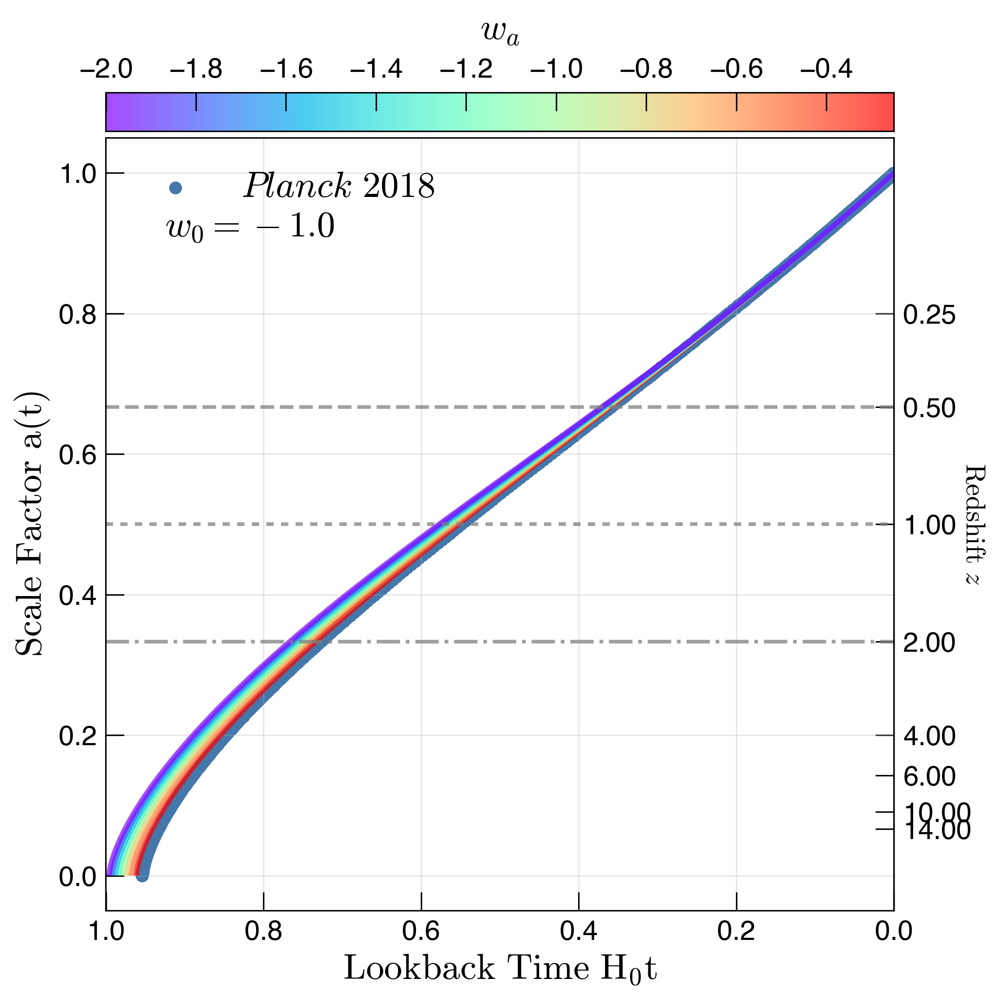

In [31]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

_ = ax.scatter(time_look_Planck, a_Planck, label=Planck_label)


w0 = -1.0   
lines_DE = []

for i, wa in enumerate(wa_all):
    table_fname_w0wa = f"expansion/Planck_w0_0_wa_{i:.0f}Fine.txt"
    table_w0wa = np.loadtxt(table_fname_w0wa, skiprows=10, delimiter =',')

    z_w0wa = table_w0wa[:,0]
    l_z_w0wa = table_w0wa[:,1]
    a_w0wa = table_w0wa[:,2]
    time_look_w0wa = table_w0wa[:,3]
    time_age_w0wa = table_w0wa[:,4]

    line_elm = np.zeros((time_look_w0wa.size, 2))
    line_elm[:,0] = time_look_w0wa
    line_elm[:,1] = a_w0wa
    _ = lines_DE.append(line_elm)

linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)
im = ax.add_collection(linescollec_DE)
divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("top", size="5%", pad=0.05)
_ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="horizontal")

cbar_str = r"$w_a$"
_ = cbar_ax.set_xlabel(cbar_str, rotation=0, fontsize=20)
_ = cbar_ax.xaxis.set_label_position('top')
_ = cbar_ax.xaxis.set_ticks_position('top')
_ = cbar_ax.xaxis.labelpad = 10

w0_str = rf"$w_0 = {w0:.1f}$"
x_redshift = 0.925
y_redshift = 0.91
_ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)

_ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
_ = ax.set_xlim(1.0,0.)

_ = ax.axhline(a_lookref_0, c='gray', ls='--', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_1, c='gray', ls=':', lw=2, alpha=0.75)
_ = ax.axhline(a_lookref_2, c='gray', ls='-.', lw=2, alpha=0.75)

_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) $", fontsize=20)
_ = ax.tick_params(which='both', axis='both')

ax2y = ax.secondary_yaxis('right', functions=(a2z, z2a))
_ = ax2y.set_yticks([0.25, 0.5, 1., 2., 4., 6., 10., 14])
_ = ax2y.set_ylabel(r"$\rm{Redshift}$" + r"$\ z$", rotation=270, labelpad=8)

_ = ax.legend(loc='upper left')
_ = ax.grid(alpha=0.3)


_ = fig.tight_layout()
_ = plt.savefig('BasicExpansionPlanck_w0wa_ZoomIn_oneplot.png', bbox_inches='tight', dpi=256)

In [32]:
scalefn_Planck = interpolate.interp1d(time_look_Planck, a_Planck)
time_look_Planck_max = np.max(time_look_Planck)
time_look_Planck_min = np.min(time_look_Planck)

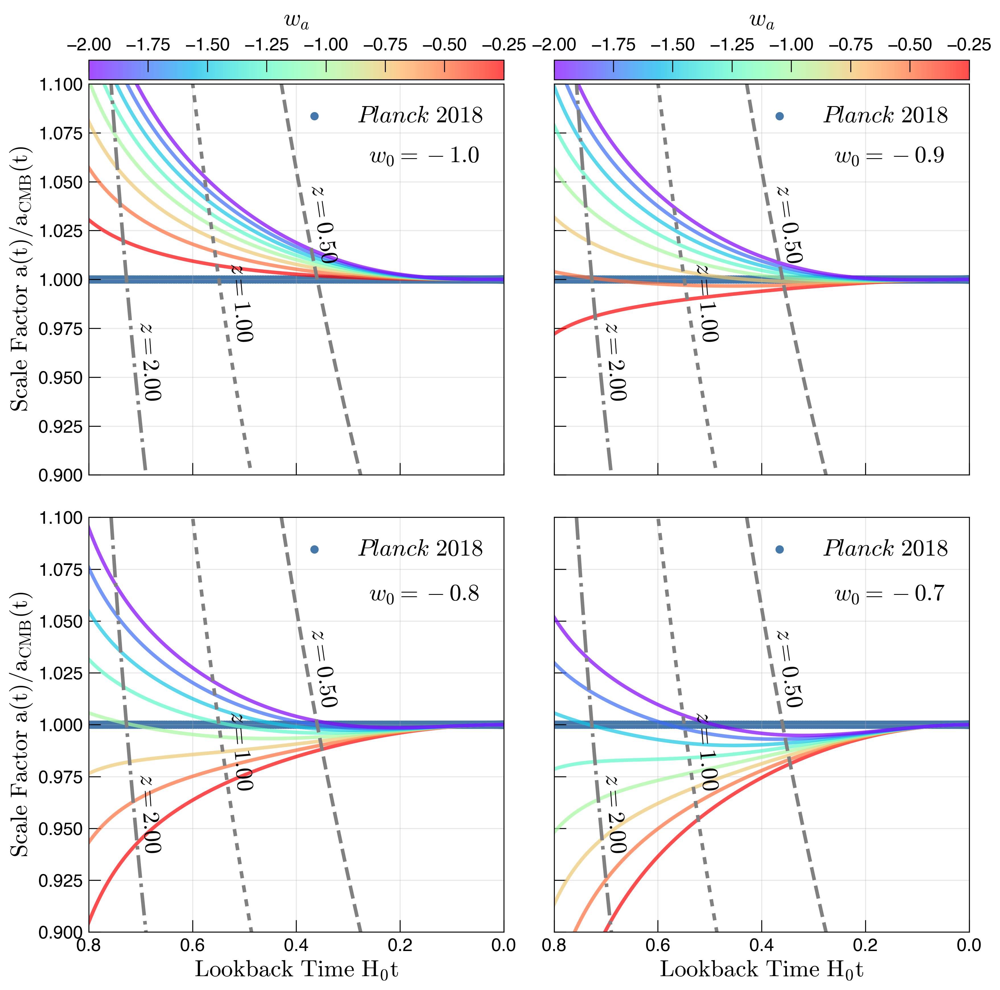

In [33]:
fig, ax_all = plt.subplots(figsize=(12,12), nrows=2, ncols=2)

w0_all = np.array([-1.0, -0.9, -0.8, -0.7])
wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])

redshifts_lookref = np.array([0.5, 1.0, 2.0])
a_lookref = 1. / (1. + redshifts_lookref)
a_lookref_0, a_lookref_1, a_lookref_2 = a_lookref
strlabel_lookref_0 = rf"$z = {redshifts_lookref[0]:.2f}$"
strlabel_lookref_1 = rf"$z = {redshifts_lookref[1]:.2f}$"
strlabel_lookref_2 = rf"$z = {redshifts_lookref[2]:.2f}$"

# ax_all_flat
for a, ax in enumerate(ax_all.flatten()):
    good_time_mask = (time_look_Planck_min < time_look_Planck) & (time_look_Planck < time_look_Planck_max)
    good_time = time_look_Planck[good_time_mask]
    a_norm = a_Planck[good_time_mask] / scalefn_Planck(good_time)
    _ = ax.scatter(good_time, a_norm, label=Planck_label)


    w0 = w0_all[a]    
    lines_DE = []

    for i, wa in enumerate(wa_all):
        table_fname_w0wa = f"expansion/Planck_w0_{a:.0f}_wa_{i:.0f}Fine.txt"
        table_w0wa = np.loadtxt(table_fname_w0wa, skiprows=10, delimiter =',')

        z_w0wa = table_w0wa[:,0]
        l_z_w0wa = table_w0wa[:,1]
        a_w0wa = table_w0wa[:,2]
        time_look_w0wa = table_w0wa[:,3]
        time_age_w0wa = table_w0wa[:,4]

        
        good_time_mask = (time_look_Planck_min < time_look_w0wa) & (time_look_w0wa < time_look_Planck_max)
        good_time = time_look_w0wa[good_time_mask]
        a_norm = a_w0wa[good_time_mask] / scalefn_Planck(good_time)

        
        line_elm = np.zeros((good_time.size, 2))
        line_elm[:,0] = good_time
        line_elm[:,1] = a_norm
        _ = lines_DE.append(line_elm)

    linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)
    im = ax.add_collection(linescollec_DE)
    if (a < 2):
        divider = make_axes_locatable(ax)
        cbar_ax = divider.append_axes("top", size="5%", pad=0.05)
        _ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="horizontal")

        cbar_str = r"$w_a$"
        _ = cbar_ax.set_xlabel(cbar_str, rotation=0, fontsize=20)
        _ = cbar_ax.xaxis.set_label_position('top')
        _ = cbar_ax.xaxis.set_ticks_position('top')
        _ = cbar_ax.xaxis.labelpad = 10

    w0_str = rf"$w_0 = {w0:.1f}$"
    x_redshift = 0.26
    y_redshift = 1.06
    _ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)

    if (a > 1):
        _ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
    else:
        _ = ax.tick_params(which='both', axis='both', labelbottom=False)
    
    _ = ax.set_xlim(0.8,0.)
    _ = ax.set_ylim(0.90, 1.1)

    if not (a % 2):
        _ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) / a_{\rm{CMB}}(t) $", fontsize=20)
    else:
        _ = ax.tick_params(which='both', axis='both', labelleft=False)
        
    _ = ax.legend(loc='upper right')
    _ = ax.grid(alpha=0.3)


    _ = ax.plot(time_look_Planck, a_lookref_0 / scalefn_Planck(time_look_Planck), 
                c='gray', ls='--', lw=3)
    _ = ax.plot(time_look_Planck, a_lookref_1 / scalefn_Planck(time_look_Planck), 
                c='gray', ls=':', lw=3)
    _ = ax.plot(time_look_Planck, a_lookref_2 / scalefn_Planck(time_look_Planck), 
                c='gray', ls='-.', lw=3)
    
    x_redshift = 0.38
    y_redshift = 1.01
    _ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), fontsize=20, rotation=278)
    
    x_redshift = 0.535
    y_redshift = 0.97
    _ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), fontsize=20, rotation=275)

    x_redshift = 0.71
    y_redshift = 0.94
    _ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), fontsize=20, rotation=274)
    
_ = fig.tight_layout()
_ = plt.savefig('DiffBasicExpansionPlanck_w0wa_ZoomIn.png', bbox_inches='tight', dpi=256)

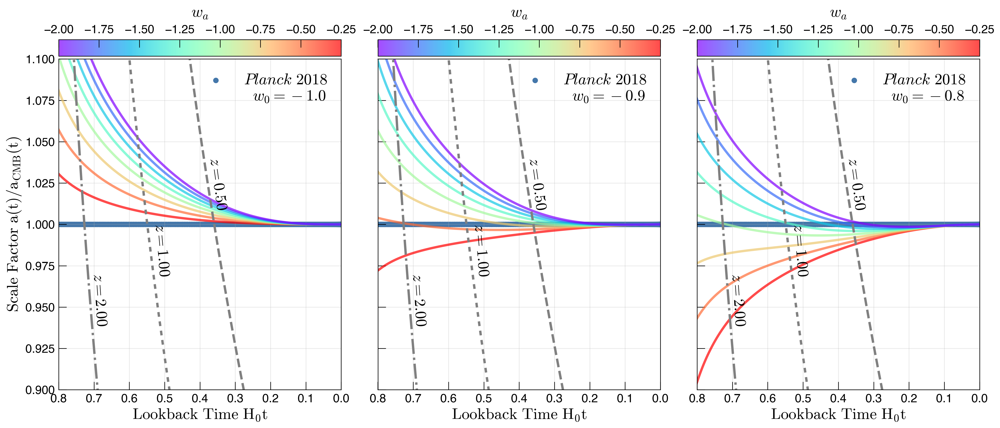

In [34]:
fig, ax_all = plt.subplots(figsize=(18,8), nrows=1, ncols=3)

w0_all = np.array([-1.0, -0.9, -0.8])
wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])


# ax_all_flat
for a, ax in enumerate(ax_all.flatten()):
    good_time_mask = (time_look_Planck_min < time_look_Planck) & (time_look_Planck < time_look_Planck_max)
    good_time = time_look_Planck[good_time_mask]
    a_norm = a_Planck[good_time_mask] / scalefn_Planck(good_time)
    _ = ax.scatter(good_time, a_norm, label=Planck_label)


    w0 = w0_all[a]    
    lines_DE = []

    for i, wa in enumerate(wa_all):
        table_fname_w0wa = f"expansion/Planck_w0_{a:.0f}_wa_{i:.0f}Fine.txt"
        table_w0wa = np.loadtxt(table_fname_w0wa, skiprows=10, delimiter =',')

        z_w0wa = table_w0wa[:,0]
        l_z_w0wa = table_w0wa[:,1]
        a_w0wa = table_w0wa[:,2]
        time_look_w0wa = table_w0wa[:,3]
        time_age_w0wa = table_w0wa[:,4]

        
        good_time_mask = (time_look_Planck_min < time_look_w0wa) & (time_look_w0wa < time_look_Planck_max)
        good_time = time_look_w0wa[good_time_mask]
        a_norm = a_w0wa[good_time_mask] / scalefn_Planck(good_time)

        
        line_elm = np.zeros((good_time.size, 2))
        line_elm[:,0] = good_time
        line_elm[:,1] = a_norm
        _ = lines_DE.append(line_elm)

    linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)
    im = ax.add_collection(linescollec_DE)
    divider = make_axes_locatable(ax)
    cbar_ax = divider.append_axes("top", size="5%", pad=0.05)
    _ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="horizontal")

    cbar_str = r"$w_a$"
    _ = cbar_ax.set_xlabel(cbar_str, rotation=0, fontsize=20)
    _ = cbar_ax.xaxis.set_label_position('top')
    _ = cbar_ax.xaxis.set_ticks_position('top')
    _ = cbar_ax.xaxis.labelpad = 10

    w0_str = rf"$w_0 = {w0:.1f}$"
    x_redshift = 0.25
    y_redshift = 1.075
    _ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)

    _ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)
    
    _ = ax.set_xlim(0.8,0.)
    _ = ax.set_ylim(0.90, 1.1)

    if not (a):
        _ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) / a_{\rm{CMB}}(t) $", fontsize=20)
    else:
        _ = ax.tick_params(which='both', axis='both', labelleft=False)
        
    _ = ax.legend(loc='upper right')
    _ = ax.grid(alpha=0.3)


    _ = ax.plot(time_look_Planck, a_lookref_0 / scalefn_Planck(time_look_Planck), 
                c='gray', ls='--', lw=3)
    _ = ax.plot(time_look_Planck, a_lookref_1 / scalefn_Planck(time_look_Planck), 
                c='gray', ls=':', lw=3)
    _ = ax.plot(time_look_Planck, a_lookref_2 / scalefn_Planck(time_look_Planck), 
                c='gray', ls='-.', lw=3)
    
    x_redshift = 0.38
    y_redshift = 1.01
    _ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), fontsize=20, rotation=278)
    
    x_redshift = 0.535
    y_redshift = 0.97
    _ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), fontsize=20, rotation=275)

    x_redshift = 0.71
    y_redshift = 0.94
    _ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), fontsize=20, rotation=274)
    
_ = fig.tight_layout()
_ = plt.savefig('DiffBasicExpansionPlanck_w0wa_ZoomIn_onerow.png', bbox_inches='tight', dpi=256)

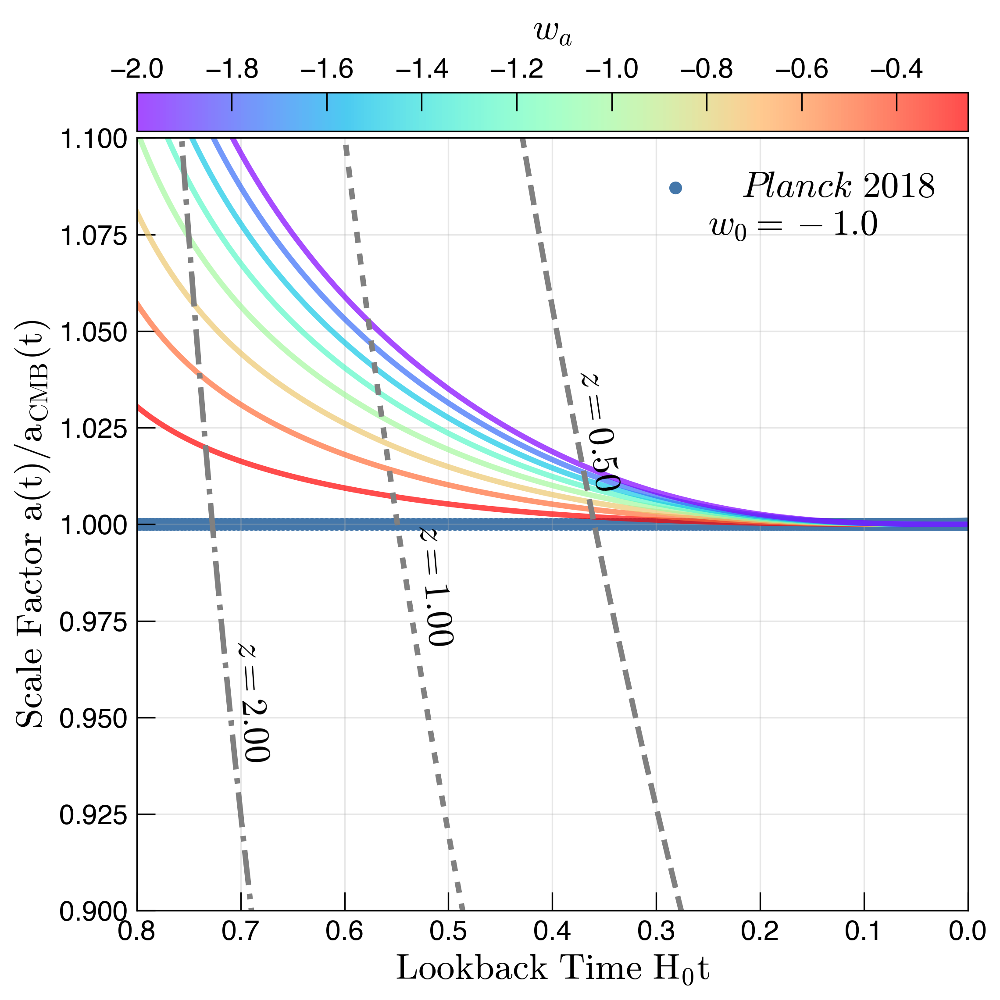

In [35]:
fig, ax = plt.subplots(figsize=(8,8), nrows=1, ncols=1)

wa_all = np.array([-0.25, -0.5, -0.75, -1., -1.25, -1.5, -1.75, -2.])


good_time_mask = (time_look_Planck_min < time_look_Planck) & (time_look_Planck < time_look_Planck_max)
good_time = time_look_Planck[good_time_mask]
a_norm = a_Planck[good_time_mask] / scalefn_Planck(good_time)
_ = ax.scatter(good_time, a_norm, label=Planck_label)

w0 = -1.0
lines_DE = []

for i, wa in enumerate(wa_all):
    table_fname_w0wa = f"expansion/Planck_w0_0_wa_{i:.0f}Fine.txt"
    table_w0wa = np.loadtxt(table_fname_w0wa, skiprows=10, delimiter =',')

    z_w0wa = table_w0wa[:,0]
    l_z_w0wa = table_w0wa[:,1]
    a_w0wa = table_w0wa[:,2]
    time_look_w0wa = table_w0wa[:,3]
    time_age_w0wa = table_w0wa[:,4]


    good_time_mask = (time_look_Planck_min < time_look_w0wa) & (time_look_w0wa < time_look_Planck_max)
    good_time = time_look_w0wa[good_time_mask]
    a_norm = a_w0wa[good_time_mask] / scalefn_Planck(good_time)


    line_elm = np.zeros((good_time.size, 2))
    line_elm[:,0] = good_time
    line_elm[:,1] = a_norm
    _ = lines_DE.append(line_elm)

linescollec_DE = LineCollection(lines_DE, array=wa_all, cmap='rainbow', alpha=0.7)
im = ax.add_collection(linescollec_DE)
divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("top", size="5%", pad=0.05)
_ = plt.colorbar(linescollec_DE, cax=cbar_ax, orientation="horizontal")

cbar_str = r"$w_a$"
_ = cbar_ax.set_xlabel(cbar_str, rotation=0, fontsize=20)
_ = cbar_ax.xaxis.set_label_position('top')
_ = cbar_ax.xaxis.set_ticks_position('top')
_ = cbar_ax.xaxis.labelpad = 10

w0_str = rf"$w_0 = {w0:.1f}$"
x_redshift = 0.25
y_redshift = 1.075
_ = ax.annotate(w0_str, xy=(x_redshift, y_redshift), fontsize=20)

_ = ax.set_xlabel(r"$\rm{Lookback}\  \rm{Time}\ H_0 t$", fontsize=20)

_ = ax.set_xlim(0.8,0.)
_ = ax.set_ylim(0.90, 1.1)

_ = ax.set_ylabel(r"$\rm{Scale}\ \rm{Factor}\ a(t) / a_{\rm{CMB}}(t) $", fontsize=20)

_ = ax.legend(loc='upper right')
_ = ax.grid(alpha=0.3)


_ = ax.plot(time_look_Planck, a_lookref_0 / scalefn_Planck(time_look_Planck), 
            c='gray', ls='--', lw=3)
_ = ax.plot(time_look_Planck, a_lookref_1 / scalefn_Planck(time_look_Planck), 
            c='gray', ls=':', lw=3)
_ = ax.plot(time_look_Planck, a_lookref_2 / scalefn_Planck(time_look_Planck), 
            c='gray', ls='-.', lw=3)

x_redshift = 0.38
y_redshift = 1.01
_ = ax.annotate(strlabel_lookref_0, xy=(x_redshift, y_redshift), fontsize=20, rotation=278)

x_redshift = 0.535
y_redshift = 0.97
_ = ax.annotate(strlabel_lookref_1, xy=(x_redshift, y_redshift), fontsize=20, rotation=275)

x_redshift = 0.71
y_redshift = 0.94
_ = ax.annotate(strlabel_lookref_2, xy=(x_redshift, y_redshift), fontsize=20, rotation=274)

_ = fig.tight_layout()
_ = plt.savefig('DiffBasicExpansionPlanck_w0wa_ZoomIn_oneplot.png', bbox_inches='tight', dpi=256)